In [1]:
import os
import re
import sys
import uproot
import peakutils

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import LogNorm

from scipy.signal import savgol_filter

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/') ## Choose right path
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [4]:
import matplotlib

# Set Palatino as the serif font
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif']  = 'Palatino'

In [5]:
fav_col = '#418094'

In [6]:
filename = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-11_25_2024-file_78.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

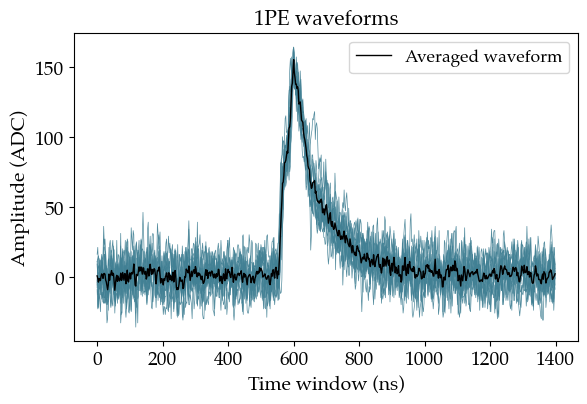

In [7]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:15]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(wf_y)
    plt.plot(wf_x, wf_y, lw=0.5, color=fav_col, alpha=0.9)

average_waveform = np.mean(np.array(all_wfs_rng), axis=0)
plt.plot(wf_x, average_waveform, label='Averaged waveform', color='k', linewidth=1)
plt.title('1PE waveforms', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/1PE_wfs_and_average_ch8.pdf', bbox_inches='tight')
plt.show()

### Check width of the averaged single PE

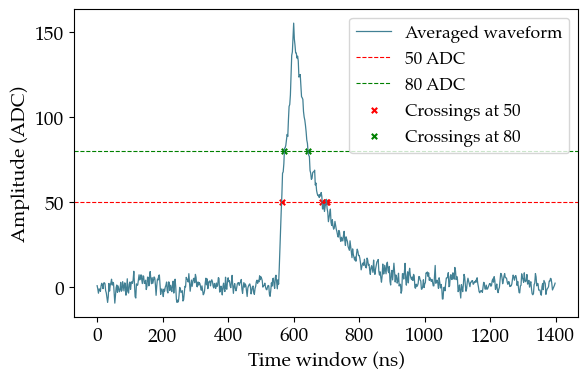

Crossings at 50: [563.0877999061787, 686.8859610721983, 697.903792427162, 700.6106035181982]
Crossings at 80: [571.6414809712994, 643.7043534734947]
Distance between crossing points:
at 50: [123.79816117  11.01783135   2.70681109]
at 80: [72.0628725]


In [8]:
def find_crossings(wf_x, waveform, level):
    # Find where the waveform crosses the level
    crosses = []
    for i in range(1, len(waveform)):
        if (waveform[i-1] < level and waveform[i] >= level) or (waveform[i-1] > level and waveform[i] <= level):
            # Linear interpolation to get a more accurate crossing point
            x_cross = wf_x[i-1] + (wf_x[i] - wf_x[i-1]) * (level - waveform[i-1]) / (waveform[i] - waveform[i-1])
            crosses.append(x_cross)
    return crosses

# Find crossings for the 50 and 80 horizontal lines
crossings_50 = find_crossings(wf_x, average_waveform, 50)
crossings_80 = find_crossings(wf_x, average_waveform, 80)

# Plot the waveform
plt.figure(figsize=(6.5, 4))
plt.plot(wf_x, average_waveform, label='Averaged waveform', color=fav_col, linewidth=0.9)
plt.axhline(50, color='r', linestyle='--', label="50 ADC", lw=0.8)
plt.axhline(80, color='g', linestyle='--', label="80 ADC", lw=0.8)
plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x', label='Crossings at 50')
plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x', label='Crossings at 80')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)', fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_ch8.pdf', bbox_inches='tight')
plt.show()

# Print the crossing points
print("Crossings at 50:", crossings_50)
print("Crossings at 80:", crossings_80)

print('Distance between crossing points:')
print("at 50:", np.diff(crossings_50))
print("at 80:", np.diff(crossings_80))


### Compute the same after applying the SG filter

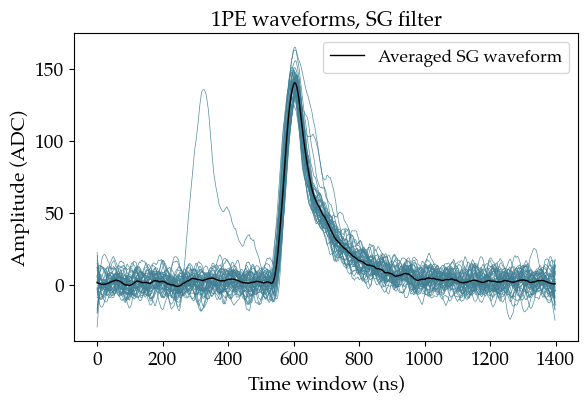

In [9]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:50]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(sgwf_y)
    plt.plot(wf_x, sgwf_y, lw=0.5, color=fav_col, alpha=0.9)

average_waveform_sg = np.mean(np.array(all_wfs_rng), axis=0)
wf_x_ave = 2*np.arange(len(wf[np.argmax(average_waveform_sg)-300:np.argmax(average_waveform_sg)+400]))
plt.plot(wf_x_ave, average_waveform_sg, label='Averaged SG waveform', color='k', linewidth=1)
plt.title('1PE waveforms, SG filter', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/1PE_wfs_and_average_sg_ch8.pdf', bbox_inches='tight')
plt.show()

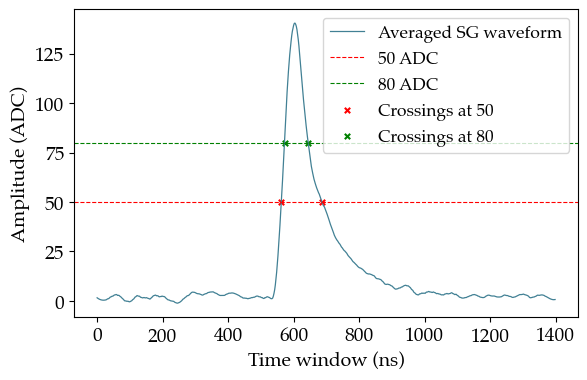

Crossings at 50: [562.2885269828605, 686.3122088747242]
Crossings at 80: [572.1169501114201, 644.2440528296931]
Distance between crossing points:
at 50: [124.02368189]
at 80: [72.12710272]


In [11]:
crossings_50 = find_crossings(wf_x_ave, average_waveform_sg, 50)
crossings_80 = find_crossings(wf_x_ave, average_waveform_sg, 80)

# Plot the waveform
plt.figure(figsize=(6.5, 4))
plt.plot(wf_x_ave, average_waveform_sg, label='Averaged SG waveform', color=fav_col, linewidth=0.9)
plt.axhline(50, color='r', linestyle='--', label="50 ADC", lw=0.8)
plt.axhline(80, color='g', linestyle='--', label="80 ADC", lw=0.8)
plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x', label='Crossings at 50')
plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x', label='Crossings at 80')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)', fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_sg.pdf', bbox_inches='tight')
plt.show()

# Print the crossing points
print("Crossings at 50:", crossings_50)
print("Crossings at 80:", crossings_80)

print('Distance between crossing points:')
print("at 50:", np.diff(crossings_50))
print("at 80:", np.diff(crossings_80))


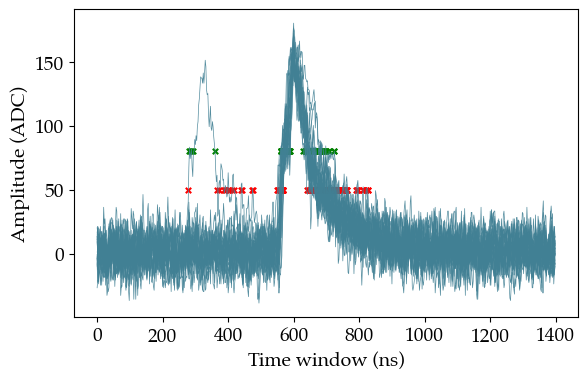

In [12]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

sel_swfs      = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0         = swfs[sel_swfs]

plt.figure(figsize=(6.5, 4))
for i, wf in enumerate(swfs0[:30]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    if len(wf_y)!=700:
        continue
        
    crossings_50 = find_crossings(wf_x, wf_y, 50)
    crossings_80 = find_crossings(wf_x, wf_y, 80)

    plt.plot(wf_x, wf_y, lw=0.5, color=fav_col, alpha=0.9)
    plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x')
    plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x')

plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.show()

### Check the crossing for each individual waveform and histogram it

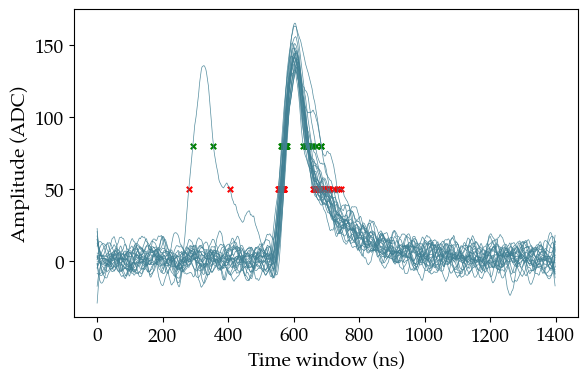

In [13]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

sel_swfs      = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0         = swfs[sel_swfs]

plt.figure(figsize=(6.5, 4))
for i, wf in enumerate(swfs0[:30]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
        
    crossings_50 = find_crossings(wf_x, sgwf_y, 50)
    crossings_80 = find_crossings(wf_x, sgwf_y, 80)

    plt.plot(wf_x, sgwf_y, lw=0.5, color=fav_col, alpha=0.9)
    plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x')
    plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x')

plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.show()

In [14]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]

diff_cross_50    = []
diff_cross_80    = []
diff_cross_50_sg = []
diff_cross_80_sg = []

for i, wf in enumerate(swfs0):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
        
    crossings_50    = find_crossings(wf_x, wf_y,   50)
    crossings_80    = find_crossings(wf_x, wf_y,   80)
    crossings_50_sg = find_crossings(wf_x, sgwf_y, 50)
    crossings_80_sg = find_crossings(wf_x, sgwf_y, 80)

    diff_cross_50   .append(np.max(np.diff(crossings_50)))
    diff_cross_80   .append(np.max(np.diff(crossings_80)))
    diff_cross_50_sg.append(np.diff(crossings_50_sg)[0])
    diff_cross_80_sg.append(np.diff(crossings_80_sg)[0])

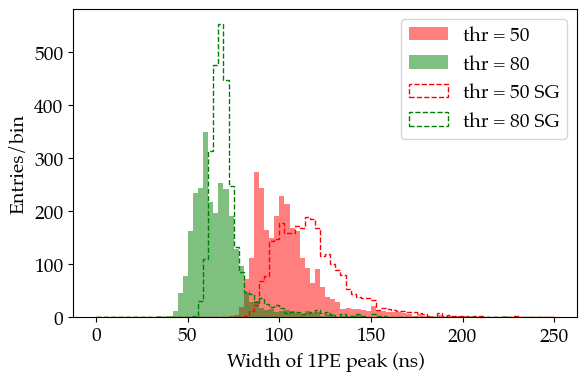

In [15]:
plt.figure(figsize=(6.5, 4))
plt.hist(diff_cross_50   , bins=90, range=(0, 250), color='r', label='thr = 50',    alpha=0.5)
plt.hist(diff_cross_80   , bins=90, range=(0, 250), color='g', label='thr = 80',    alpha=0.5)
plt.hist(diff_cross_50_sg, bins=90, range=(0, 250), color='r', label='thr = 50 SG', histtype='step', ls='--')
plt.hist(diff_cross_80_sg, bins=90, range=(0, 250), color='g', label='thr = 80 SG', histtype='step', ls='--')
plt.xlabel('Width of 1PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_ch8.pdf', bbox_inches='tight')
plt.show()

### Check the 2PE peak width

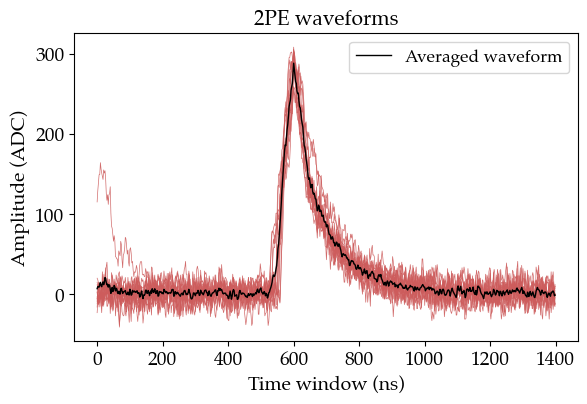

In [16]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
rng_2pe  = (220, 350)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > rng_2pe[0]) & (max_swfs < rng_2pe[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:15]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(wf_y)
    plt.plot(wf_x, wf_y, lw=0.5, color='indianred', alpha=0.9)

average_waveform_2pe = np.mean(np.array(all_wfs_rng), axis=0)
wf_x_ave = 2*np.arange(len(wf[np.argmax(average_waveform_2pe)-300:np.argmax(average_waveform_2pe)+400]))
plt.plot(wf_x_ave, average_waveform_2pe, label='Averaged waveform', color='k', linewidth=1)
plt.title('2PE waveforms', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/2PE_wfs_and_average_ch8.pdf', bbox_inches='tight')
plt.show()

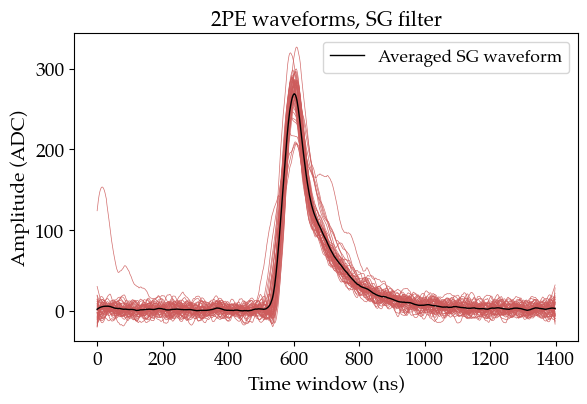

In [17]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
rng_2pe  = (220, 350)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > rng_2pe[0]) & (max_swfs < rng_2pe[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:50]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(sgwf_y)
    plt.plot(wf_x, sgwf_y, lw=0.5, color='indianred', alpha=0.9)

average_waveform_2pe_sg = np.mean(np.array(all_wfs_rng), axis=0)
wf_x_ave = 2*np.arange(len(wf[np.argmax(average_waveform_2pe_sg)-300:np.argmax(average_waveform_2pe_sg)+400]))
plt.plot(wf_x_ave, average_waveform_2pe_sg, label='Averaged SG waveform', color='k', linewidth=1)
plt.title('2PE waveforms, SG filter', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/2PE_wfs_and_average_sg_ch8.pdf', bbox_inches='tight')
plt.show()

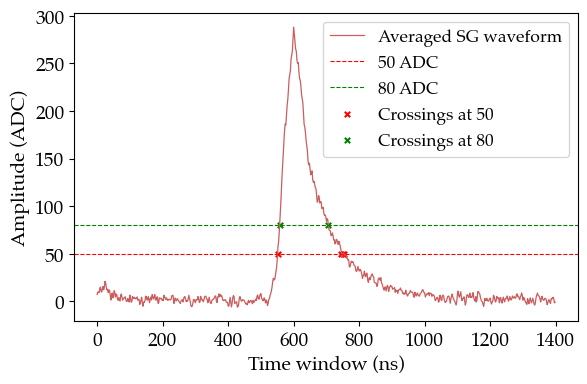

Crossings at 50: [550.8288459332466, 745.913215637207, 749.7269603844378, 752.7663478069752]
Crossings at 80: [557.1383607145071, 705.9071845995187]
Distance between crossing points:
at 50: [195.0843697    3.81374475   3.03938742]
at 80: [148.76882389]


In [18]:
crossings_50 = find_crossings(wf_x, average_waveform_2pe, 50)
crossings_80 = find_crossings(wf_x, average_waveform_2pe, 80)

# Plot the waveform
plt.figure(figsize=(6.5, 4))
plt.plot(wf_x, average_waveform_2pe, label='Averaged SG waveform', color='indianred', linewidth=0.9)
plt.axhline(50, color='r', linestyle='--', label="50 ADC", lw=0.8)
plt.axhline(80, color='g', linestyle='--', label="80 ADC", lw=0.8)
plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x', label='Crossings at 50')
plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x', label='Crossings at 80')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)', fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_2_PE_peak.pdf', bbox_inches='tight')
plt.show()

# Print the crossing points
print("Crossings at 50:", crossings_50)
print("Crossings at 80:", crossings_80)

print('Distance between crossing points:')
print("at 50:", np.diff(crossings_50))
print("at 80:", np.diff(crossings_80))


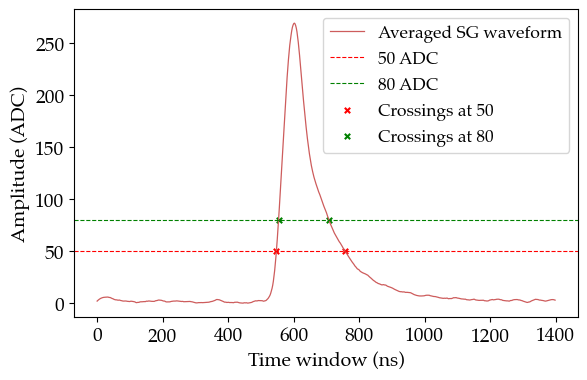

Crossings at 50: [547.2496904443758, 756.1126360521304]
Crossings at 80: [553.9187751856366, 707.4646176289347]
Distance between crossing points:
at 50: [208.86294561]
at 80: [153.54584244]


In [19]:
crossings_50 = find_crossings(wf_x, average_waveform_2pe_sg, 50)
crossings_80 = find_crossings(wf_x, average_waveform_2pe_sg, 80)

# Plot the waveform
plt.figure(figsize=(6.5, 4))
plt.plot(wf_x, average_waveform_2pe_sg, label='Averaged SG waveform', color='indianred', linewidth=0.9)
plt.axhline(50, color='r', linestyle='--', label="50 ADC", lw=0.8)
plt.axhline(80, color='g', linestyle='--', label="80 ADC", lw=0.8)
plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x', label='Crossings at 50')
plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x', label='Crossings at 80')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)', fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_2_PE_peak_sg.pdf', bbox_inches='tight')
plt.show()

# Print the crossing points
print("Crossings at 50:", crossings_50)
print("Crossings at 80:", crossings_80)

print('Distance between crossing points:')
print("at 50:", np.diff(crossings_50))
print("at 80:", np.diff(crossings_80))


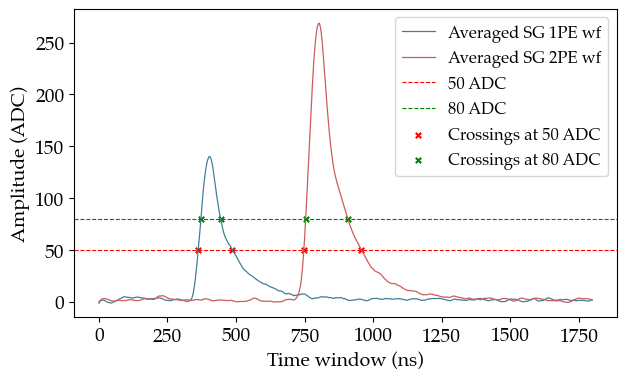

In [20]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)
rng_2pe       = (220, 350)


sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:50]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-200:np.argmax(wf)+700]))
    wf_y = wf[np.argmax(wf)-200:np.argmax(wf)+700]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=900:
        continue
    all_wfs_rng.append(sgwf_y)

average_waveform_sg = np.mean(np.array(all_wfs_rng), axis=0)

sel_swfs = (max_swfs > rng_2pe[0]) & (max_swfs < rng_2pe[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:50]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-400:np.argmax(wf)+500]))
    wf_y = wf[np.argmax(wf)-400:np.argmax(wf)+500]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=900:
        continue
    all_wfs_rng.append(sgwf_y)

average_waveform_2pe_sg = np.mean(np.array(all_wfs_rng), axis=0)

wf_x_ave     = 2*np.arange(900)
wf_x_ave_2pe = 2*np.arange(900)

crossings_50 = find_crossings(wf_x_ave, average_waveform_sg, 50)
crossings_80 = find_crossings(wf_x_ave, average_waveform_sg, 80)

crossings_50_2pe = find_crossings(wf_x_ave_2pe, average_waveform_2pe_sg, 50)
crossings_80_2pe = find_crossings(wf_x_ave_2pe, average_waveform_2pe_sg, 80)

# Plot the waveform
plt.figure(figsize=(7, 4))
plt.plot(wf_x_ave,     average_waveform_sg    , label='Averaged SG 1PE wf', color=fav_col, linewidth=0.9)
plt.plot(wf_x_ave_2pe, average_waveform_2pe_sg, label='Averaged SG 2PE wf', color='indianred', linewidth=0.9)
plt.axhline(50, color='r', linestyle='--', label="50 ADC", lw=0.8)
plt.axhline(80, color='g', linestyle='--', label="80 ADC", lw=0.8)
plt.scatter(crossings_50, [50] * len(crossings_50), color='r', s=15, marker='x', label='Crossings at 50 ADC')
plt.scatter(crossings_80, [80] * len(crossings_80), color='g', s=15, marker='x', label='Crossings at 80 ADC')
plt.scatter(crossings_50_2pe, [50] * len(crossings_50), color='r', s=15, marker='x')
plt.scatter(crossings_80_2pe, [80] * len(crossings_80), color='g', s=15, marker='x')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)', fontsize=14)
plt.legend(fontsize=12)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_1_and_2_PE_peak_sg.pdf', bbox_inches='tight')
plt.show()

In [21]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
rng_2pe  = (220, 350)

sel_swfs = (max_swfs > rng_2pe[0]) & (max_swfs < rng_2pe[1])
swfs0    = swfs[sel_swfs]

diff_cross_50_2pe    = []
diff_cross_80_2pe    = []
diff_cross_50_2pe_sg = []
diff_cross_80_2pe_sg = []

for i, wf in enumerate(swfs0):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
        
    crossings_50    = find_crossings(wf_x, wf_y,   50)
    crossings_80    = find_crossings(wf_x, wf_y,   80)
    crossings_50_sg = find_crossings(wf_x, sgwf_y, 50)
    crossings_80_sg = find_crossings(wf_x, sgwf_y, 80)

    diff_cross_50_2pe   .append(np.max(np.diff(crossings_50)))
    diff_cross_80_2pe   .append(np.max(np.diff(crossings_80)))
    diff_cross_50_2pe_sg.append(np.diff(crossings_50_sg)[0])
    diff_cross_80_2pe_sg.append(np.diff(crossings_80_sg)[0])

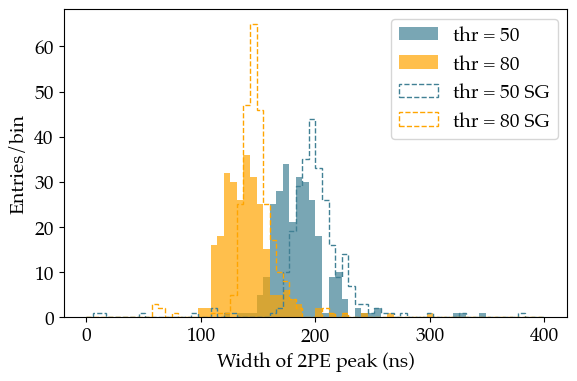

In [22]:
plt.figure(figsize=(6.5, 4))
plt.hist(diff_cross_50_2pe   , bins=70, range=(0, 400), color=fav_col,  label='thr = 50',    alpha=0.7)
plt.hist(diff_cross_80_2pe   , bins=70, range=(0, 400), color='orange', label='thr = 80',    alpha=0.7)
plt.hist(diff_cross_50_2pe_sg, bins=70, range=(0, 400), color=fav_col,  label='thr = 50 SG', histtype='step', ls='--')
plt.hist(diff_cross_80_2pe_sg, bins=70, range=(0, 400), color='orange', label='thr = 80 SG', histtype='step', ls='--')
plt.xlabel('Width of 2PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_2_PE_peak_comparison_hist_ch8.pdf', bbox_inches='tight')
plt.show()

118.76594003219245 72.91823520568369 198.963118679534 149.22581197617322


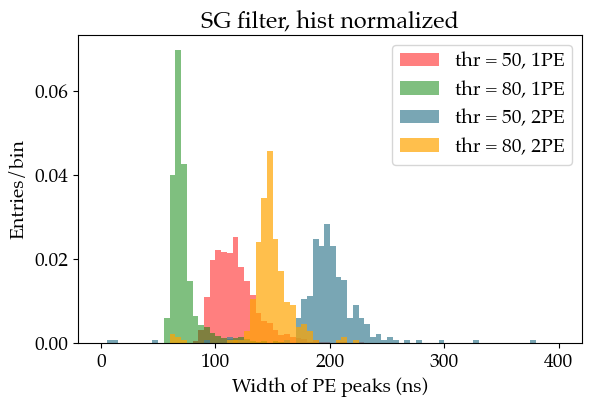

In [23]:
plt.figure(figsize=(6.5, 4))
plt.hist(diff_cross_50_sg,     bins=80, range=(0, 400), color='r',      label='thr = 50, 1PE', alpha=0.5, density=True)
plt.hist(diff_cross_80_sg,     bins=80, range=(0, 400), color='g',      label='thr = 80, 1PE', alpha=0.5, density=True)
plt.hist(diff_cross_50_2pe_sg, bins=80, range=(0, 400), color=fav_col,  label='thr = 50, 2PE', alpha=0.7, density=True)
plt.hist(diff_cross_80_2pe_sg, bins=80, range=(0, 400), color='orange', label='thr = 80, 2PE', alpha=0.7, density=True)

print(np.mean(diff_cross_50_sg), np.mean(diff_cross_80_sg),
      np.mean(diff_cross_50_2pe_sg), np.mean(diff_cross_80_2pe_sg))
plt.title('SG filter, hist normalized')
plt.xlabel('Width of PE peaks (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_1_and_2_PE_peak_comparison_hist_norm_ch8.pdf', bbox_inches='tight')
plt.show()

## Check for the other channels

In [24]:
single_pe_diff_cross_50    = {}
single_pe_diff_cross_80    = {}
single_pe_diff_cross_50_sg = {}
single_pe_diff_cross_80_sg = {}
for ch in range(9):
    print(ch)
    wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
    swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
    max_swfs = np.max(swfs, axis=1)
    single_pe_rng = (100, 200)
    
    sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
    swfs0    = swfs[sel_swfs]
    
    diff_cross_50    = []
    diff_cross_80    = []
    diff_cross_50_sg = []
    diff_cross_80_sg = []
    
    for i, wf in enumerate(swfs0):
        wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
        wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
        if len(wf_x)==0 or len(wf_y)==0:
            continue
        sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
        if len(wf_y)!=700:
            continue
            
        crossings_50    = find_crossings(wf_x, wf_y,   50)
        crossings_80    = find_crossings(wf_x, wf_y,   80)
        crossings_50_sg = find_crossings(wf_x, sgwf_y, 50)
        crossings_80_sg = find_crossings(wf_x, sgwf_y, 80)
    
        try:
            diff_cross_50   .append(np.max(np.diff(crossings_50)))
            diff_cross_80   .append(np.max(np.diff(crossings_80)))
            diff_cross_50_sg.append(np.max(np.diff(crossings_50_sg)))
            diff_cross_80_sg.append(np.max(np.diff(crossings_80_sg)))
        except IndexError:
            continue
        except ValueError:
            continue
        
    single_pe_diff_cross_50   [ch] = diff_cross_50   
    single_pe_diff_cross_80   [ch] = diff_cross_80   
    single_pe_diff_cross_50_sg[ch] = diff_cross_50_sg
    single_pe_diff_cross_80_sg[ch] = diff_cross_80_sg

0
1
2
3
4
5
6
7
8


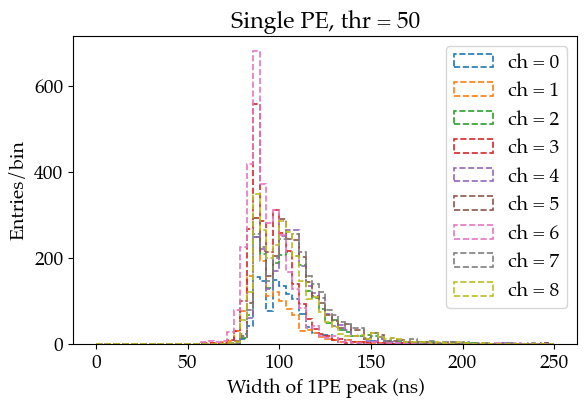

In [25]:
plt.figure(figsize=(6.5, 4))
for ch in range(9):
    plt.hist(single_pe_diff_cross_50[ch], bins=70, range=(0, 250), label=f'ch = {ch}', histtype='step', ls='--', lw=1.2)
plt.title('Single PE, thr = 50')
plt.xlabel('Width of 1PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr50_all_chs.pdf', bbox_inches='tight')
plt.show()

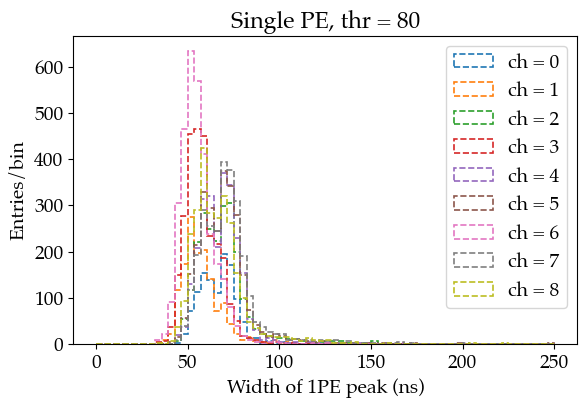

In [26]:
plt.figure(figsize=(6.5, 4))
for ch in range(9):
    plt.hist(single_pe_diff_cross_80[ch], bins=70, range=(0, 250), label=f'ch = {ch}', histtype='step', ls='--', lw=1.2)
plt.title('Single PE, thr = 80')
plt.xlabel('Width of 1PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr80_all_chs.pdf', bbox_inches='tight')
plt.show()

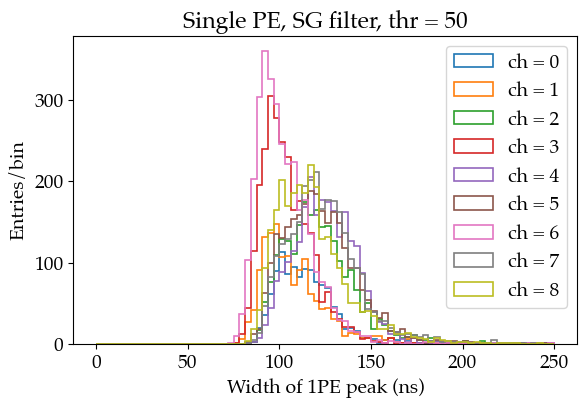

In [27]:
plt.figure(figsize=(6.5, 4))
for ch in range(9):
    plt.hist(single_pe_diff_cross_50_sg[ch], bins=80, range=(0, 250), label=f'ch = {ch}', histtype='step', lw=1.2)
plt.title('Single PE, SG filter, thr = 50')
plt.xlabel('Width of 1PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr50_sg_all_chs.pdf', bbox_inches='tight')
plt.show()

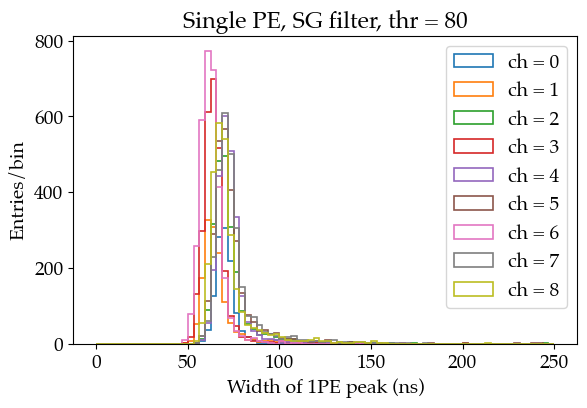

In [28]:
plt.figure(figsize=(6.5, 4))
for ch in range(9):
    plt.hist(single_pe_diff_cross_80_sg[ch], bins=80, range=(0, 250), label=f'ch = {ch}', histtype='step', lw=1.2)
plt.title('Single PE, SG filter, thr = 80')
plt.xlabel('Width of 1PE peak (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr80_sg_all_chs.pdf', bbox_inches='tight')
plt.show()

## Same for the trigger channels

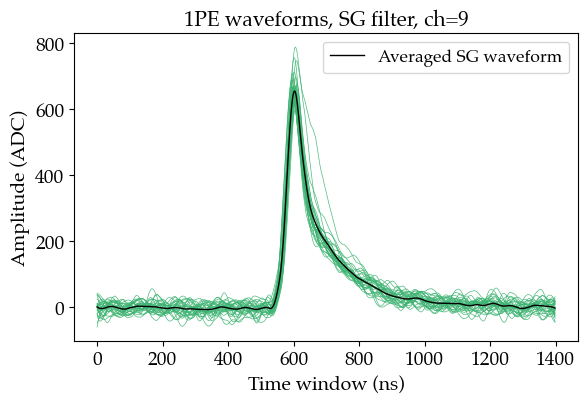

In [29]:
ch       = 9
num_wfs  = 100
wfs      = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs     = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs[:num_wfs]])
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (500, 1000)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:num_wfs]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_x)==0 or len(wf_y)==0:
        continue
    sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(sgwf_y)
    plt.plot(wf_x, sgwf_y, lw=0.5, color='mediumseagreen', alpha=0.9)

average_waveform_sg = np.mean(np.array(all_wfs_rng), axis=0)
wf_x_ave = 2*np.arange(len(wf[np.argmax(average_waveform_sg)-300:np.argmax(average_waveform_sg)+400]))
plt.plot(wf_x_ave, average_waveform_sg, label='Averaged SG waveform', color='k', linewidth=1)
plt.title('1PE waveforms, SG filter, ch=9', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/1PE_wfs_and_average_sg_ch9.pdf', bbox_inches='tight')
plt.show()

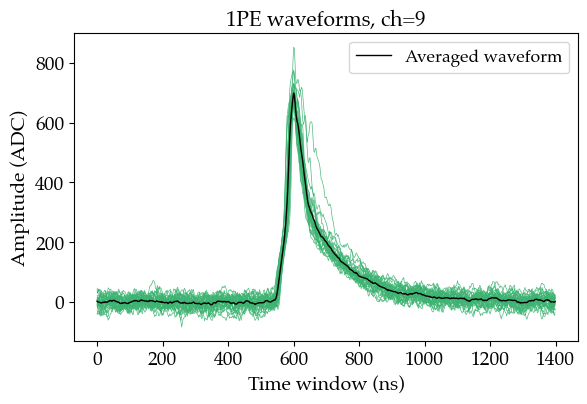

In [30]:
ch       = 9
num_wfs  = 100
wfs      = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs     = swfs = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs[:num_wfs]])
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (500, 1000)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:num_wfs]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(wf_y)
    plt.plot(wf_x, wf_y, lw=0.5, color='mediumseagreen', alpha=0.9)

average_waveform = np.mean(np.array(all_wfs_rng), axis=0)
plt.plot(wf_x, average_waveform, label='Averaged waveform', color='k', linewidth=1)
plt.title('1PE waveforms, ch=9', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/1PE_wfs_and_average_ch9.pdf', bbox_inches='tight')
plt.show()

In [31]:
single_pe_diff_trigg_cross_50    = {}
single_pe_diff_trigg_cross_80    = {}
single_pe_diff_trigg_cross_50_sg = {}
single_pe_diff_trigg_cross_80_sg = {}
for ch in [9, 10, 11]:
    print(ch)
    wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
    swfs = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs])
    max_swfs = np.max(swfs, axis=1)
    single_pe_rng = (500, 1000)
    
    sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
    swfs0    = swfs[sel_swfs]
    
    diff_cross_50    = []
    diff_cross_80    = []
    diff_cross_50_sg = []
    diff_cross_80_sg = []
    
    for i, wf in enumerate(swfs0):
        wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
        wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
        if len(wf_x)==0 or len(wf_y)==0:
            continue
        sgwf_y = savgol_filter(wf_y, window_length=30, polyorder=3)
        if len(wf_y)!=700:
            continue
            
        crossings_50    = find_crossings(wf_x, wf_y,   50)
        crossings_80    = find_crossings(wf_x, wf_y,   80)
        crossings_50_sg = find_crossings(wf_x, sgwf_y, 50)
        crossings_80_sg = find_crossings(wf_x, sgwf_y, 80)
    
        try:
            diff_cross_50   .append(np.max(np.diff(crossings_50)))
            diff_cross_80   .append(np.max(np.diff(crossings_80)))
            diff_cross_50_sg.append(np.max(np.diff(crossings_50_sg)))
            diff_cross_80_sg.append(np.max(np.diff(crossings_80_sg)))
        except IndexError:
            continue
        except ValueError:
            continue
        
    single_pe_diff_trigg_cross_50   [ch] = diff_cross_50   
    single_pe_diff_trigg_cross_80   [ch] = diff_cross_80   
    single_pe_diff_trigg_cross_50_sg[ch] = diff_cross_50_sg
    single_pe_diff_trigg_cross_80_sg[ch] = diff_cross_80_sg

9
10
11


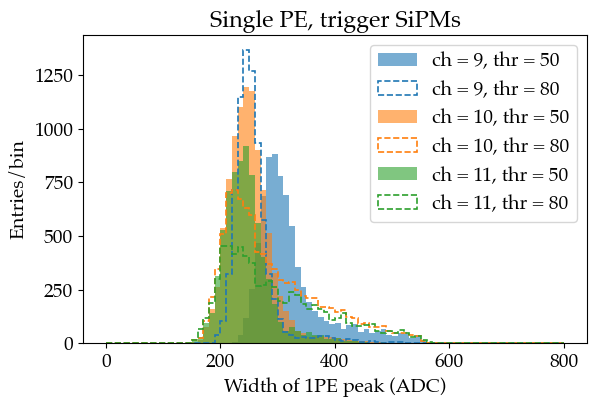

In [32]:
plt.figure(figsize=(6.5, 4))
for ch, col in zip([9, 10, 11], plt.cm.tab10.colors):
    plt.hist(single_pe_diff_trigg_cross_50[ch], bins=80, range=(0, 800), label=f'ch = {ch}, thr = 50', color=col, alpha=0.6)
    plt.hist(single_pe_diff_trigg_cross_80[ch], bins=80, range=(0, 800), label=f'ch = {ch}, thr = 80', histtype='step', color=col, lw=1.2, ls='--')
plt.title('Single PE, trigger SiPMs')
plt.xlabel('Width of 1PE peak (ADC)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr50_and_80_trigg_chs.pdf', bbox_inches='tight')
plt.show()

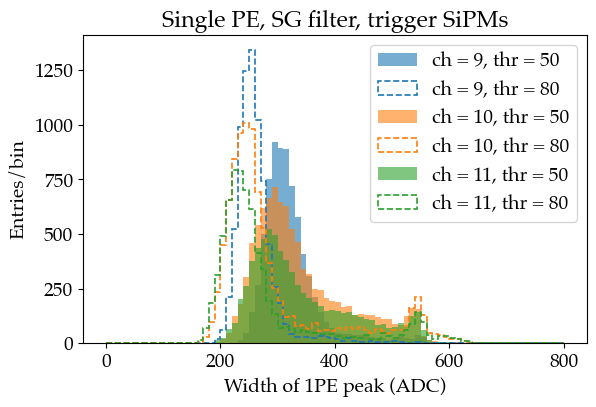

In [33]:
plt.figure(figsize=(6.5, 4))
for ch, col in zip([9, 10, 11], plt.cm.tab10.colors):
    plt.hist(single_pe_diff_trigg_cross_50_sg[ch], bins=80, range=(0, 800), label=f'ch = {ch}, thr = 50', color=col, alpha=0.6)
    plt.hist(single_pe_diff_trigg_cross_80_sg[ch], bins=80, range=(0, 800), label=f'ch = {ch}, thr = 80', histtype='step', color=col, lw=1.2, ls='--')
plt.title('Single PE, SG filter, trigger SiPMs')
plt.xlabel('Width of 1PE peak (ADC)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/width_single_PE_peak_comparison_hist_thr50_and_80_sg_trigg_chs.pdf', bbox_inches='tight')
plt.show()

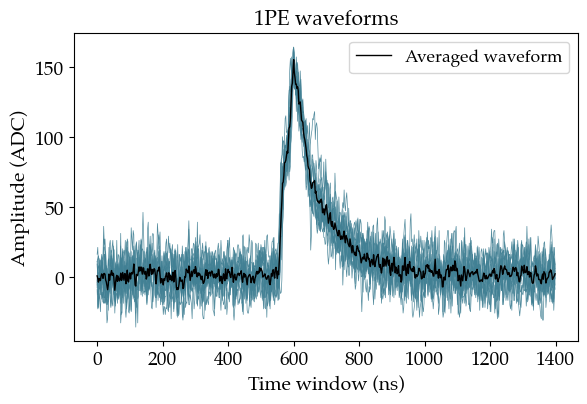

In [34]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)
single_pe_rng = (100, 200)

plt.figure(figsize=(6.5, 4))

sel_swfs = (max_swfs > single_pe_rng[0]) & (max_swfs < single_pe_rng[1])
swfs0    = swfs[sel_swfs]
all_wfs_rng = []
for i, wf in enumerate(swfs0[:15]):
    wf_x = 2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400]))
    wf_y = wf[np.argmax(wf)-300:np.argmax(wf)+400]
    if len(wf_y)!=700:
        continue
    all_wfs_rng.append(wf_y)
    plt.plot(wf_x, wf_y, lw=0.5, color=fav_col, alpha=0.9)

average_waveform = np.mean(np.array(all_wfs_rng), axis=0)
plt.plot(wf_x, average_waveform, label='Averaged waveform', color='k', linewidth=1)
plt.title('1PE waveforms', fontsize=15)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.legend(fontsize=12.5)
#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/1PE_wfs_and_average_ch8.pdf', bbox_inches='tight')
plt.show()

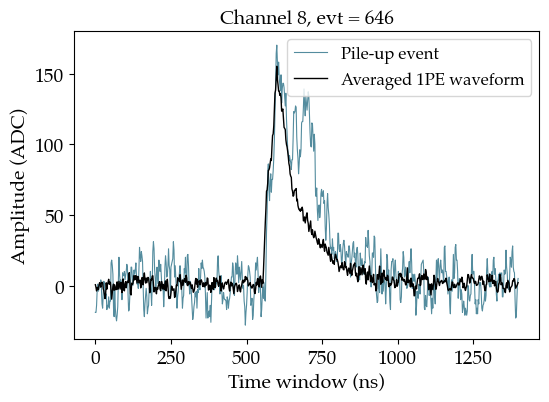

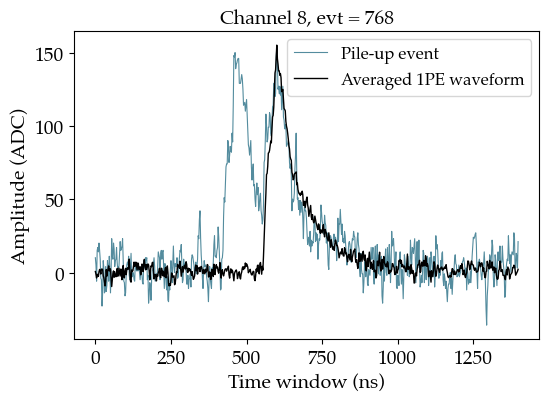

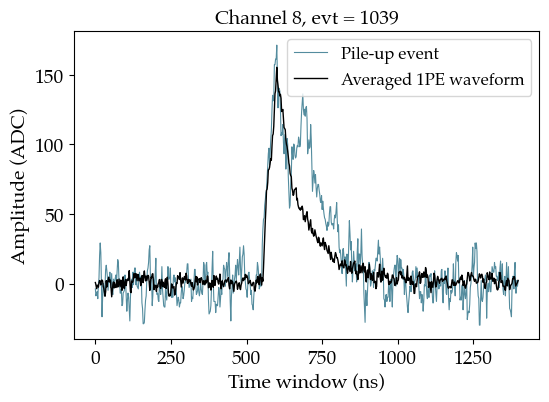

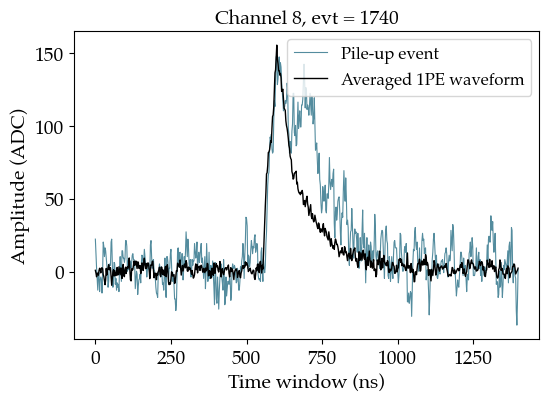

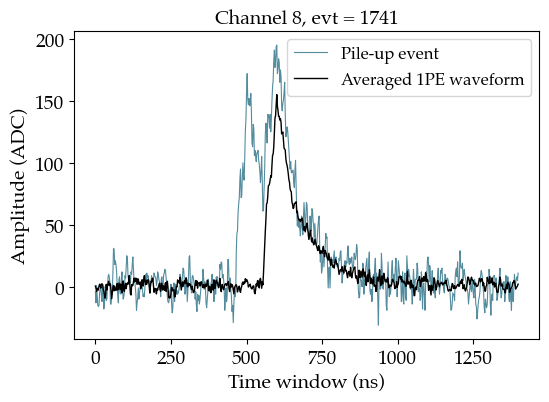

...

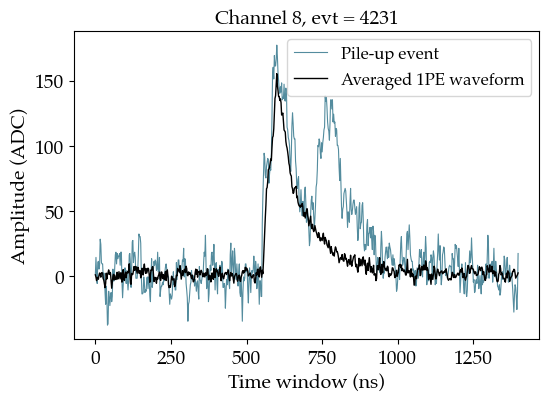

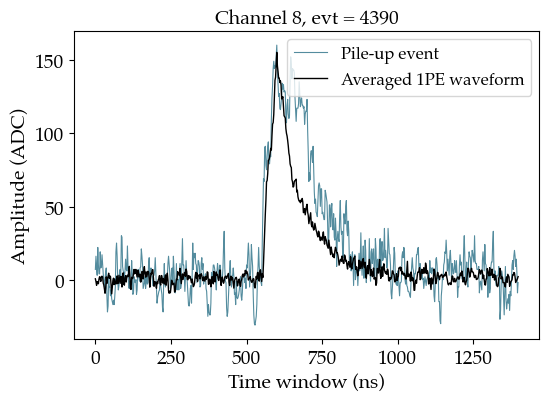

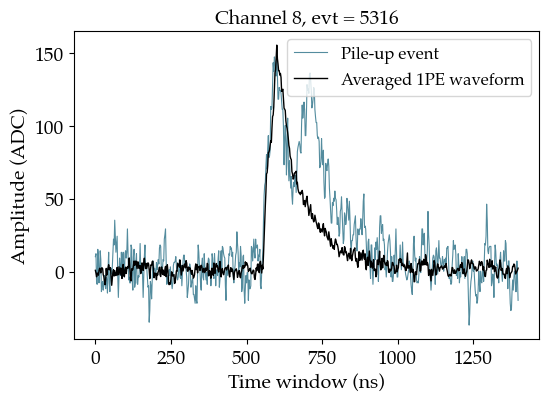

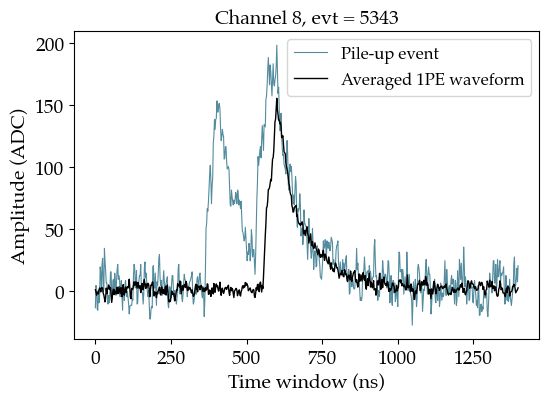

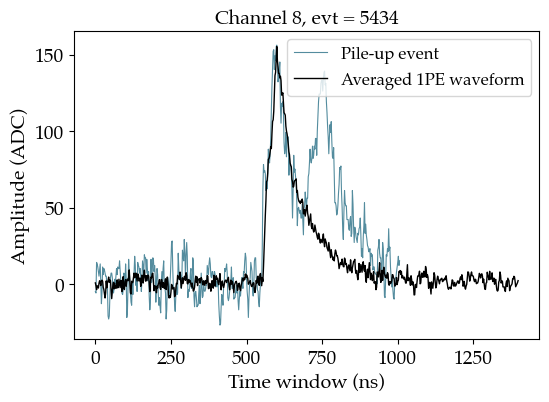

In [35]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)

for i, (wf, mxwf) in enumerate(zip(swfs[0:6000], max_swfs[0:6000])):
    if i not in [646, 768, 1039, 1740, 1741, 3296, 4231, 4390, 5316, 5343, 5434]:
        continue
    if mxwf<100:
        continue
    sgwf = savgol_filter(wf, window_length=50, polyorder=3)
    plt.figure(figsize=(6, 4))
    plt.plot(2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400])), wf  [np.argmax(wf)-300:np.argmax(wf)+400], lw=0.8, color=fav_col, alpha=0.9, label='Pile-up event')
    plt.plot(wf_x, average_waveform, label='Averaged 1PE waveform', color='k', linewidth=1)
    plt.title(f'Channel {ch}, evt = {i}', fontsize=14)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.legend(fontsize=12)
    plt.show()

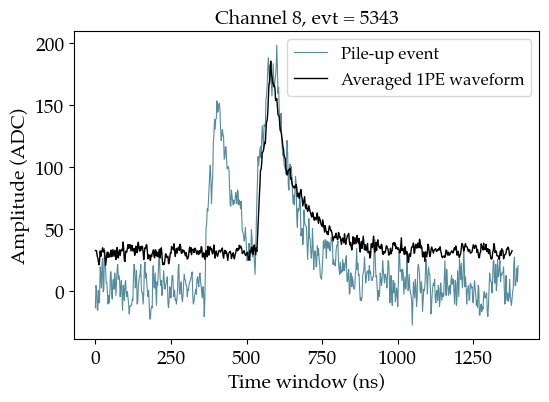

In [36]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)

for i, (wf, mxwf) in enumerate(zip(swfs[0:6000], max_swfs[0:6000])):
    if i not in [5343]:
        continue
    sgwf = savgol_filter(wf, window_length=50, polyorder=3)
    plt.figure(figsize=(6, 4))
    plt.plot(2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400])), wf  [np.argmax(wf)-300:np.argmax(wf)+400], lw=0.8, color=fav_col, alpha=0.9, label='Pile-up event')
    plt.plot(wf_x[:690], 30+average_waveform[10:], label='Averaged 1PE waveform', color='k', linewidth=1)
    plt.title(f'Channel {ch}, evt = {i}', fontsize=14)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.legend(fontsize=12)
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/pile_up_evt_4.pdf', bbox_inches='tight')
    plt.show()

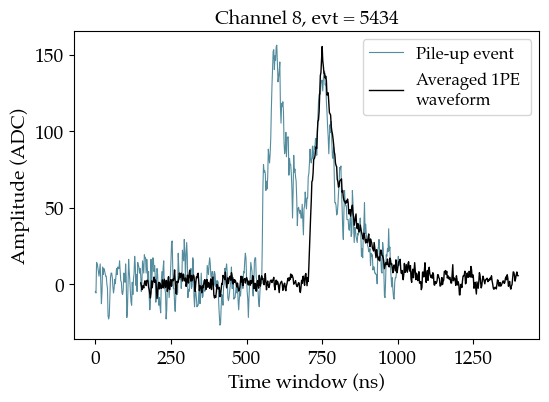

In [37]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)

for i, (wf, mxwf) in enumerate(zip(swfs[0:6000], max_swfs[0:6000])):
    if i not in [5434]:
        continue
    sgwf = savgol_filter(wf, window_length=50, polyorder=3)
    plt.figure(figsize=(6, 4))
    plt.plot(2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400])), wf  [np.argmax(wf)-300:np.argmax(wf)+400], lw=0.8, color=fav_col, alpha=0.9, label='Pile-up event')
    plt.plot(wf_x[75:], average_waveform[:625], label='Averaged 1PE \nwaveform', color='k', linewidth=1)
    plt.title(f'Channel {ch}, evt = {i}', fontsize=14)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.legend(fontsize=12)
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/pile_up_evt_3.pdf', bbox_inches='tight')
    plt.show()

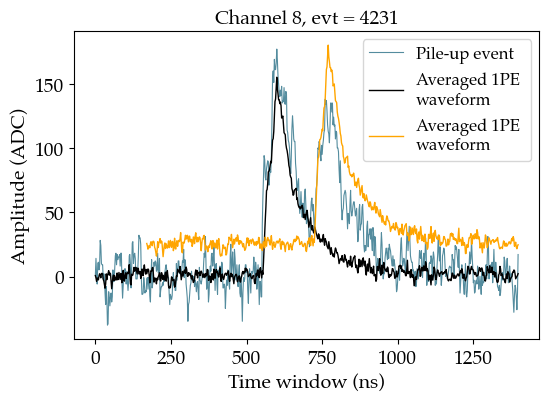

In [38]:
ch   = 8
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 650))
max_swfs = np.max(swfs, axis=1)

for i, (wf, mxwf) in enumerate(zip(swfs[0:6000], max_swfs[0:6000])):
    if i not in [4231]:
        continue
    sgwf = savgol_filter(wf, window_length=50, polyorder=3)
    plt.figure(figsize=(6, 4))
    plt.plot(2*np.arange(len(wf[np.argmax(wf)-300:np.argmax(wf)+400])), wf  [np.argmax(wf)-300:np.argmax(wf)+400], lw=0.8, color=fav_col, alpha=0.9, label='Pile-up event')
    plt.plot(wf_x, average_waveform, label='Averaged 1PE \nwaveform', color='k', linewidth=1)
    plt.plot(wf_x[85:], 25+average_waveform[:615], label='Averaged 1PE \nwaveform', color='orange', linewidth=1)
    plt.title(f'Channel {ch}, evt = {i}', fontsize=14)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.legend(fontsize=12)
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/pile_up_evt_8.pdf', bbox_inches='tight')
    plt.show()

## Testing the script:

In [42]:
from functools import partial

## Parameters
max_smpl_bsl        = 650
#std_bsl_thr         = 15
sg_filter_window    =  30
sg_filter_polyorder =   3
thr_ADC             =  50 #ths for the noise suppression and peak finder after SG filter
thr_ADC_trigg       = 100 #ths for the noise suppression and peak finder after SG filter for the trigger SiPMs
min_dist            =  15 #min distance between peaks for peakutils

## Thr values valid from 9/10/2024 since the bas voltage was changed
std_thr_dict = {0: 13,
                1: 13,
                2: 13,
                3: 13,
                4: 14,
                5: 13,
                6: 12,
                7: 13,
                8: 13,
                9: 30,
                10: 40,
                11: 40}

normal_chs  = range(9)
trigger_chs = [9, 10, 11]


#### CHANNELS FROM 0 TO 8:
## In the normal SiPMs, a filter is performed to remove the baseline evts
filt_wfs_dict = {ch: np.array([(evt, wf)
                               for evt, wf in enumerate(pf.wfs_from_rawtree(RawTree, ch)) if np.std(wf) > std_thr_dict[ch]], dtype=object)
                 for ch in normal_chs}

#filt_evts = np.unique(np.concatenate(np.array([filt_wfs_dict[ch].T[0] for ch in normal_chs])))
filt_evts_dict = {ch: filt_wfs_dict[ch].T[0]
                  if len(filt_wfs_dict[ch])!=0 else []
                  for ch in normal_chs}

## Baseline subtraction
subt_wfs_dict = {ch: np.array([pf.subtract_baseline_std_lim(fwf,
                                                            mode=False,
                                                            wf_range_bsl=(0, max_smpl_bsl),
                                                            std_lim=3*std_thr_dict[ch])
                                                            for _, fwf in filt_wfs_dict[ch]])
                 if len(filt_wfs_dict[ch])!=0 else []
                 for ch in normal_chs}

## Apply the Savitzky-Golay filter to smooth the wf
sg_filt_swfs_dict = {ch: savgol_filter(subt_wfs_dict[ch],
                                       window_length=sg_filter_window,
                                       polyorder=sg_filter_polyorder)
                     if len(subt_wfs_dict[ch]) != 0 else []
                     for ch in normal_chs}

## Noise suppression
zs_sg_filt_swfs_dict = {ch: pf.noise_suppression(sg_filt_swfs_dict[ch],
                                                 threshold=thr_ADC)
                        if len(sg_filt_swfs_dict[ch]) != 0 else []
                        for ch in normal_chs}

## Get peaks above thr_ADC
partial_get_peaks_peakutils = partial(pf.get_peaks_peakutils, thres=thr_ADC, min_dist=min_dist, thres_abs=True)
idx_peaks_ch_dict = {ch: np.array(list(map(partial_get_peaks_peakutils, zs_sg_filt_swfs_dict[ch])), dtype=object)
                     for ch in normal_chs}

idx_peaks_thr_ch_dict = {ch: np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch_dict[ch][i])
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                         for ch in normal_chs}

height_peaks_sg_ch_dict = {ch: np.array([pf.peak_height(wf, idx_peaks_ch_dict[ch][i])
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                        for ch in normal_chs}

height_peaks_sg_deconv_ch_dict = {ch: np.array([pf.peak_height_deconv(wf,
                                                                      idx_peaks_ch_dict      [ch][i],
                                                                      height_peaks_sg_ch_dict[ch][i].copy(),
                                                                      thr = thr_ADC)
                               for i, wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                               for ch in normal_chs}

idx_peaks_ch_dict = {ch: np.array([pf.peak_height_deconv_indexes(wf,
                                                                 idx_peaks_ch_dict      [ch][i],
                                                                 height_peaks_sg_ch_dict[ch][i].copy(),
                                                                 thr = thr_ADC)
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                         for ch in normal_chs}

idx_peaks_thr_ch_dict = {ch: np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch_dict[ch][i])
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                         for ch in normal_chs}

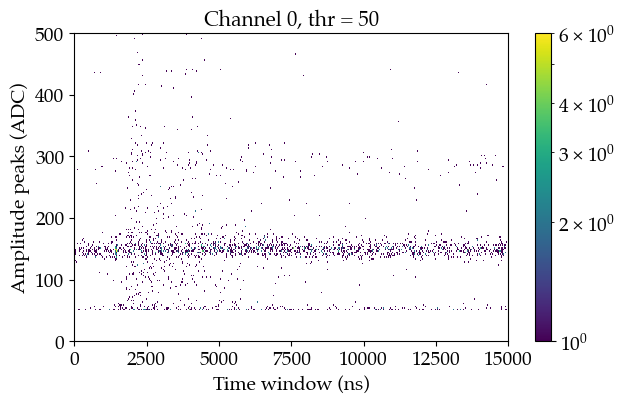

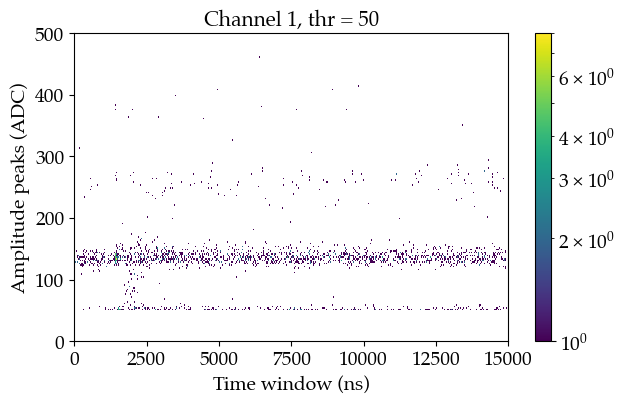

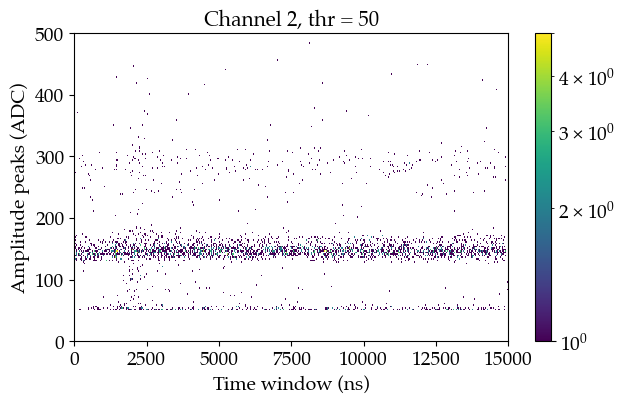

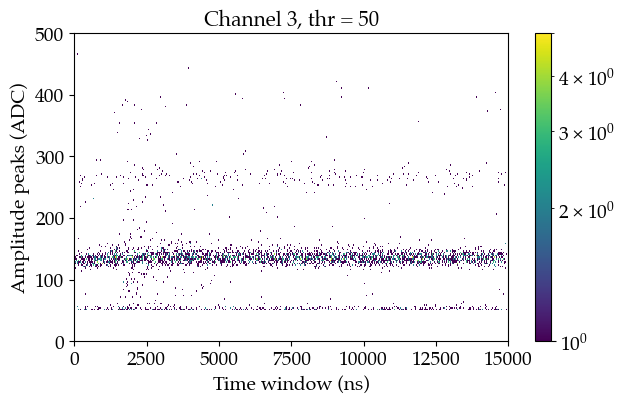

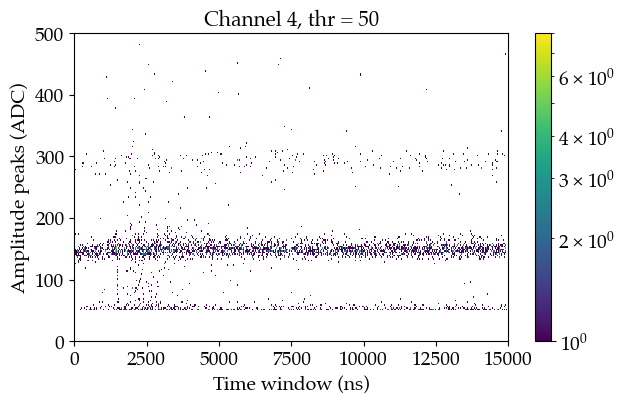

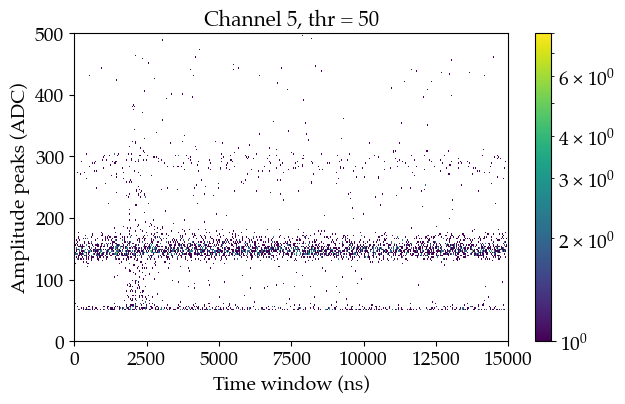

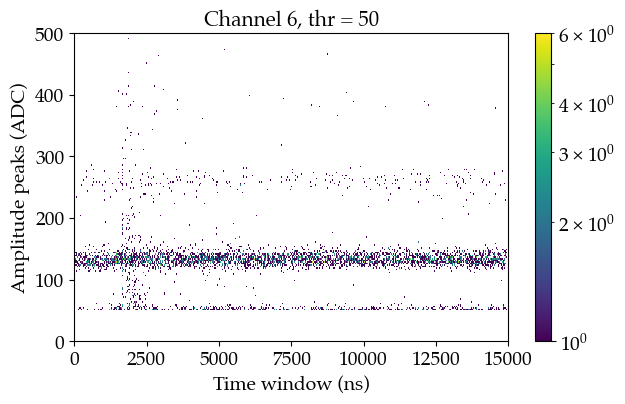

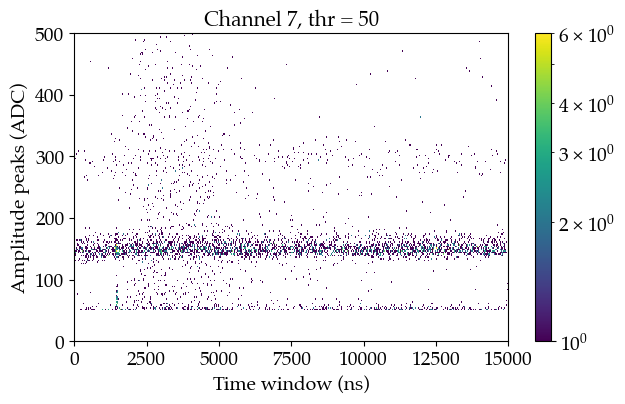

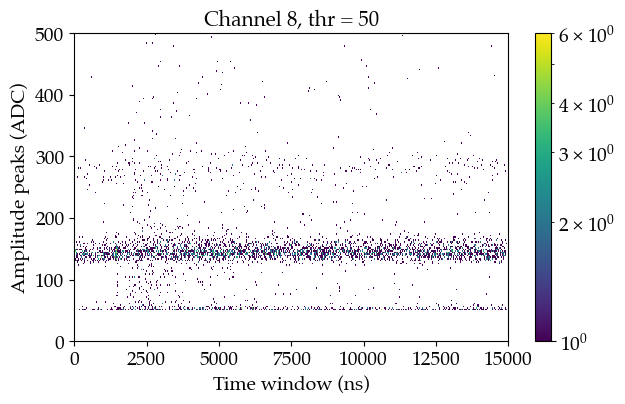

In [43]:
for ch in normal_chs:

    ch_idxs = np.concatenate(idx_peaks_thr_ch_dict[ch])
    ch_vals = np.concatenate(height_peaks_sg_deconv_ch_dict[ch])
    
    plt.figure(figsize=(7, 4))
    plt.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
    plt.xlabel('Time window (ns)',       fontsize=14)
    plt.ylabel('Amplitude peaks (ADC)',  fontsize=14)
    plt.title(f"Channel {ch}, thr = 50", fontsize=15)
    plt.colorbar()

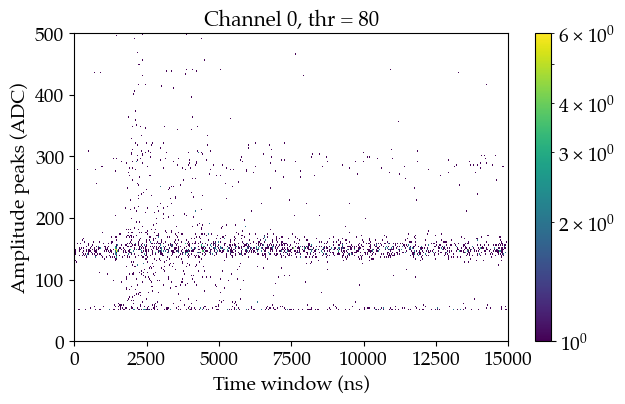

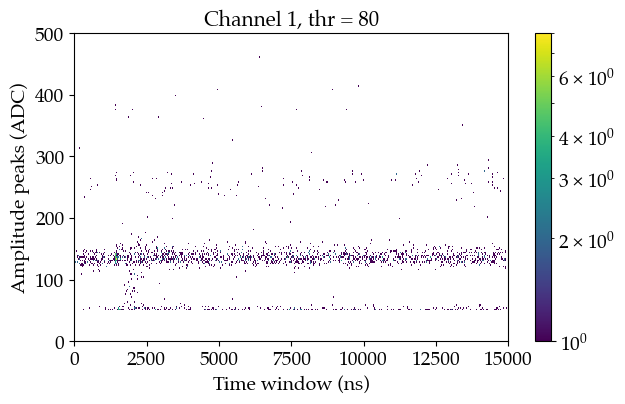

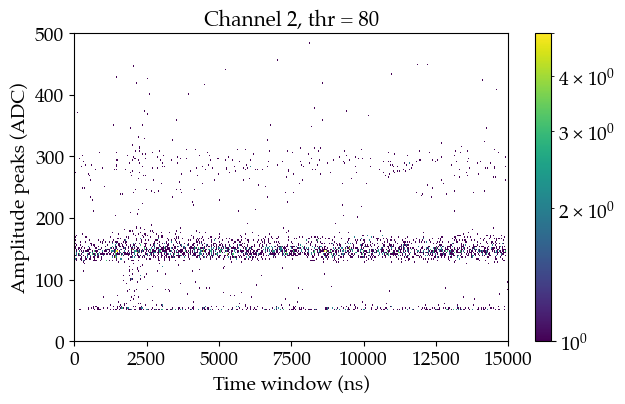

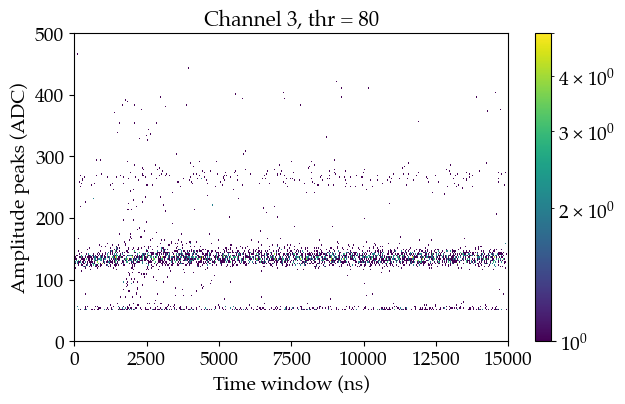

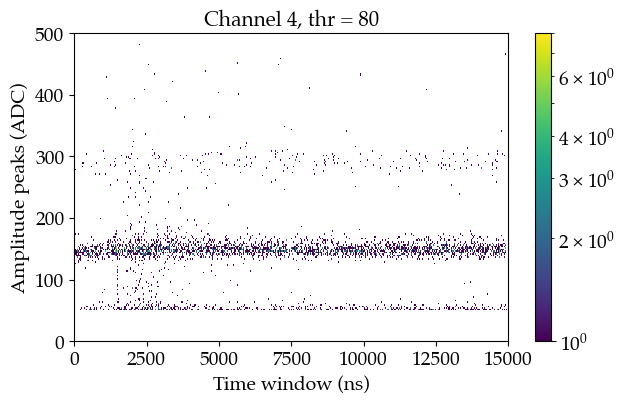

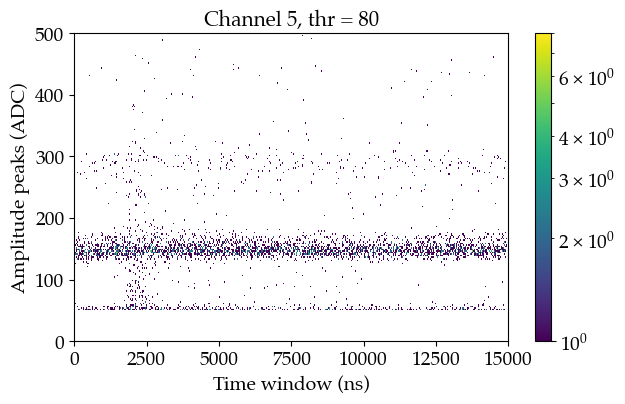

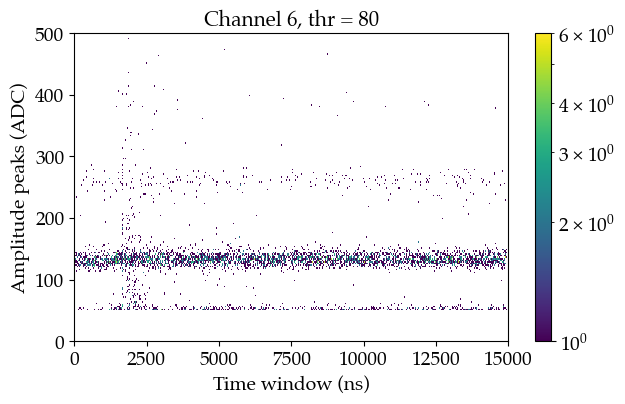

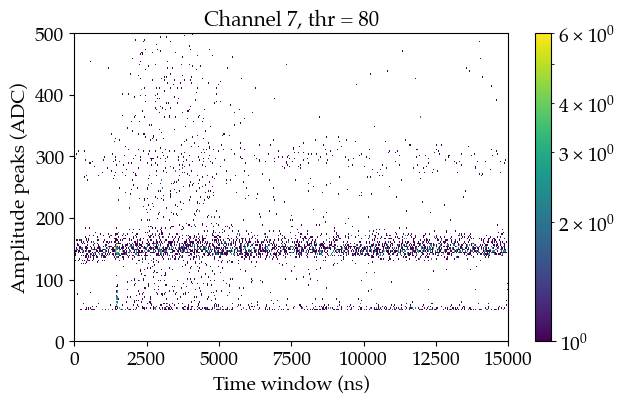

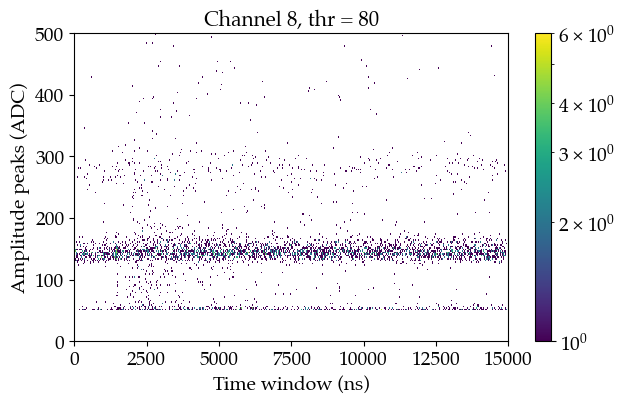

In [44]:
for ch in normal_chs:

    ch_idxs = np.concatenate(idx_peaks_thr_ch_dict[ch])
    ch_vals = np.concatenate(height_peaks_sg_deconv_ch_dict[ch])
    
    plt.figure(figsize=(7, 4))
    plt.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
    plt.xlabel('Time window (ns)',       fontsize=14)
    plt.ylabel('Amplitude peaks (ADC)',  fontsize=14)
    plt.title(f"Channel {ch}, thr = 80", fontsize=15)
    plt.colorbar()

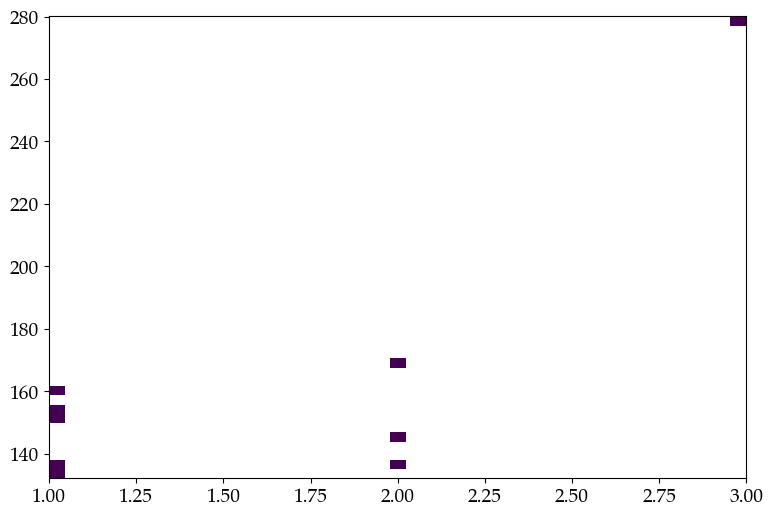

In [46]:
plt.hist2d(num_peaks, max_peaks, bins=(43, 50), cmin=1);

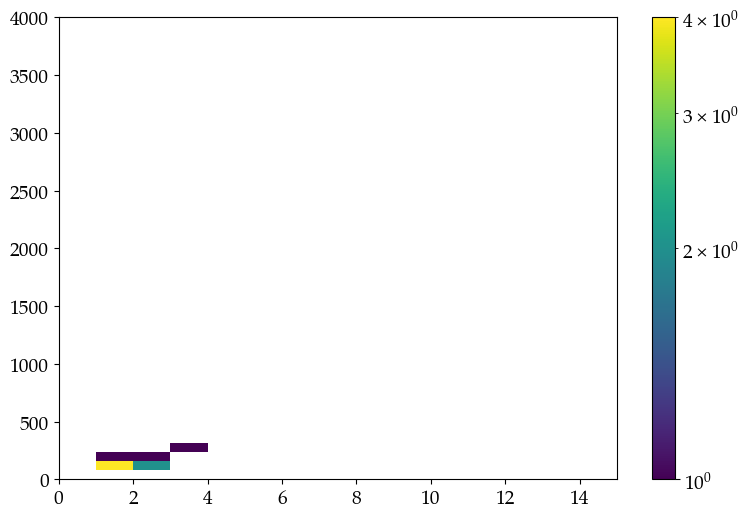

In [47]:
plt.hist2d(num_peaks, max_peaks, bins=(15, 50), range=((0, 15), (0, 4000)), cmin=1, norm=LogNorm())
plt.colorbar();

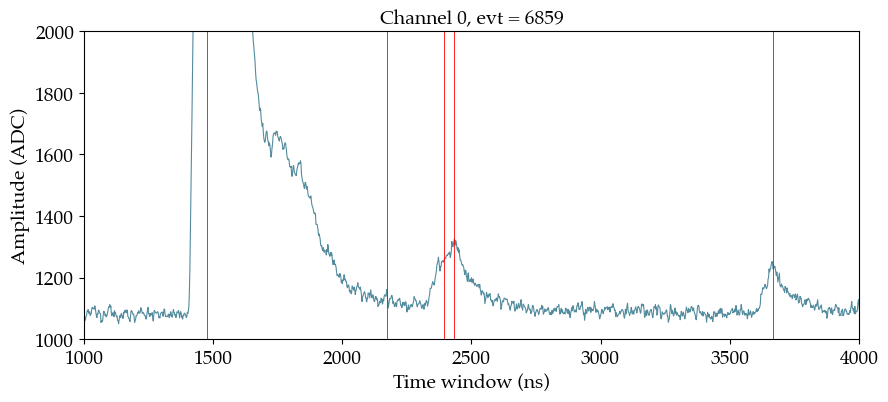

In [48]:
ch  = 0
evt = 6859
wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
plt.figure(figsize=(10, 4))
plt.plot(2*np.arange(len(wf)), wf, lw=0.8, color=fav_col, alpha=0.9)
for val in [739, 1087, 1196, 1217, 1834, 2158, 6312]:
    plt.axvline(val*2, color='r', lw=0.6)
plt.title(f'Channel {ch}, evt = {evt}', fontsize=14)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.ylim(1000, 2000)
plt.xlim(1000, 4000)
plt.show()

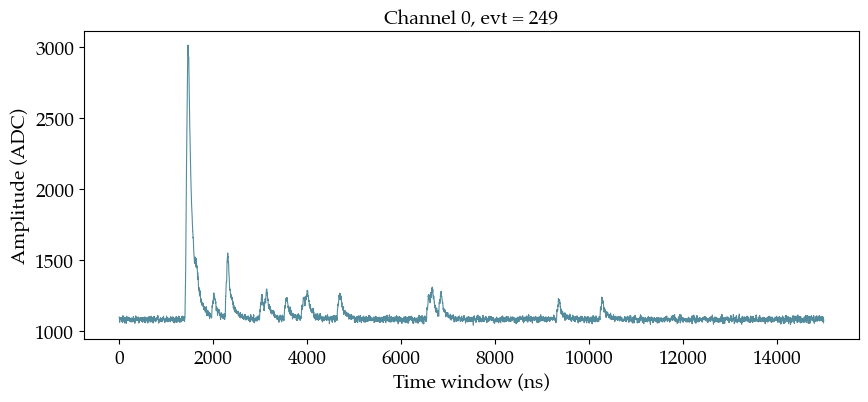

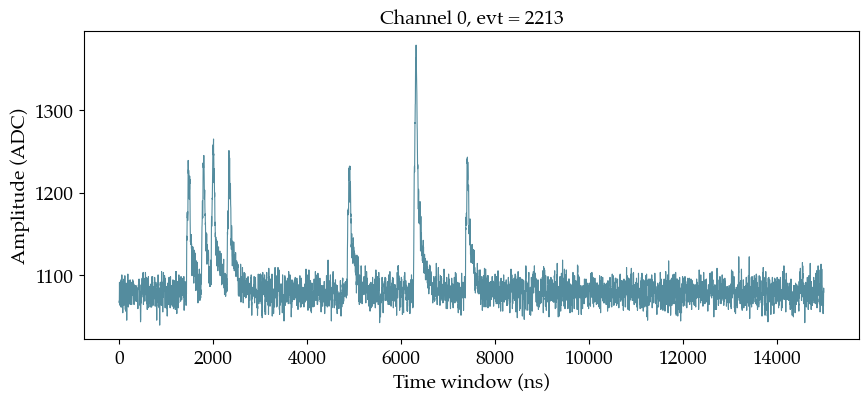

In [49]:
ch  = 0
evt = filt_evts_dict[0][19]
wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
plt.figure(figsize=(10, 4))
plt.plot(2*np.arange(len(wf)), wf, lw=0.8, color=fav_col, alpha=0.9)
plt.title(f'Channel {ch}, evt = {evt}', fontsize=14)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.show()

ch  = 0
evt = filt_evts_dict[0][135]
wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
plt.figure(figsize=(10, 4))
plt.plot(2*np.arange(len(wf)), wf, lw=0.8, color=fav_col, alpha=0.9)
plt.title(f'Channel {ch}, evt = {evt}', fontsize=14)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.show()

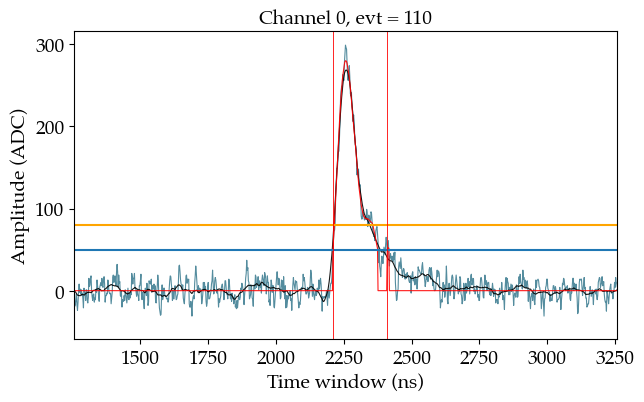

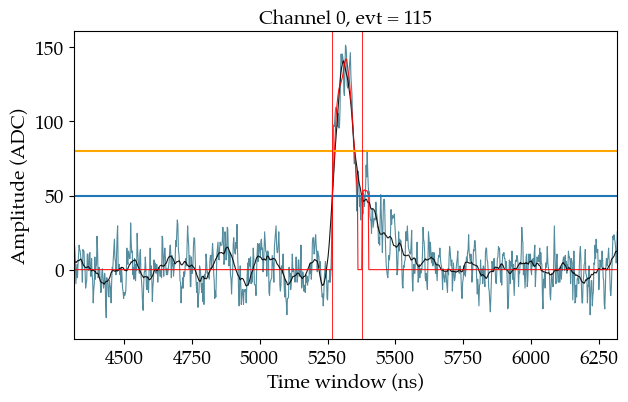

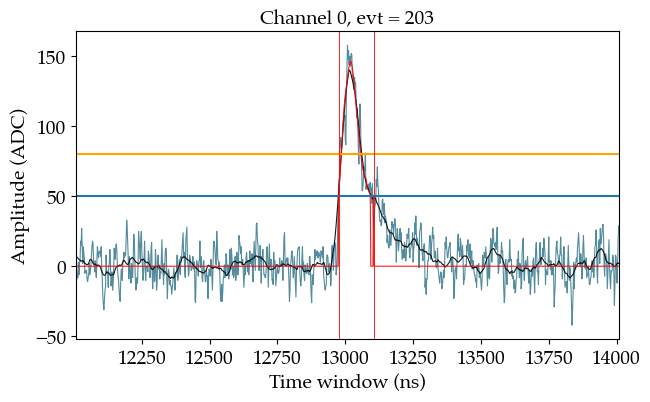

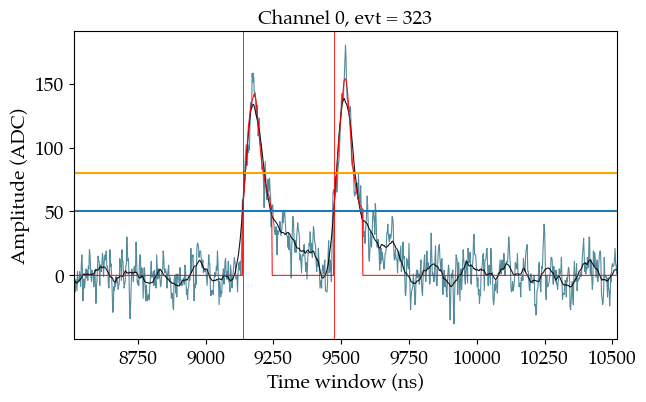

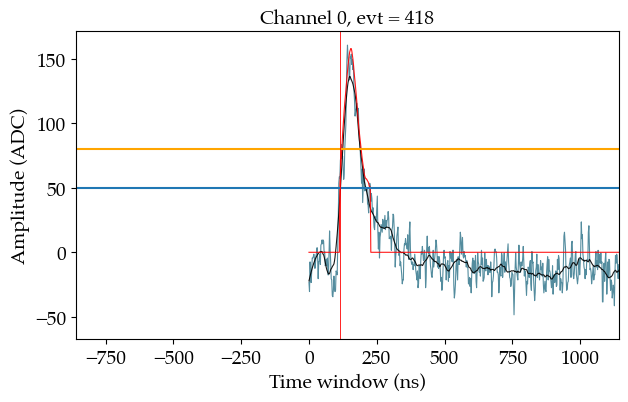

...

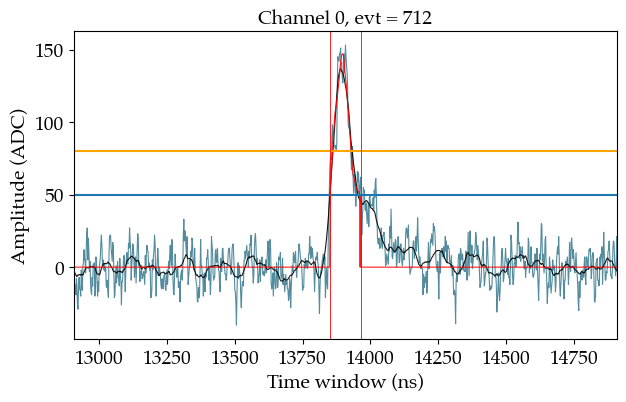

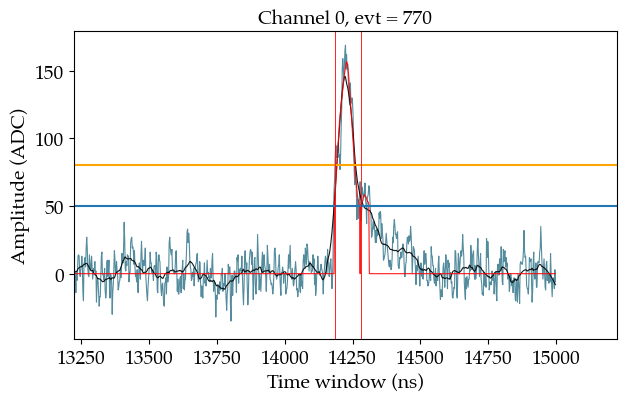

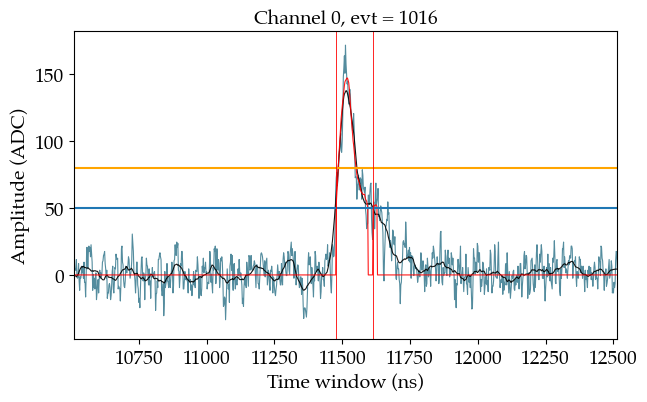

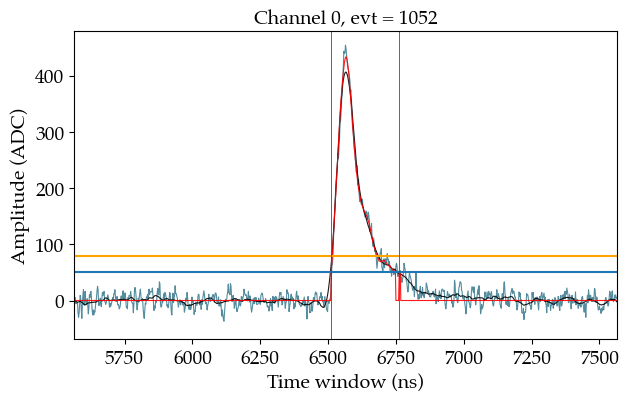

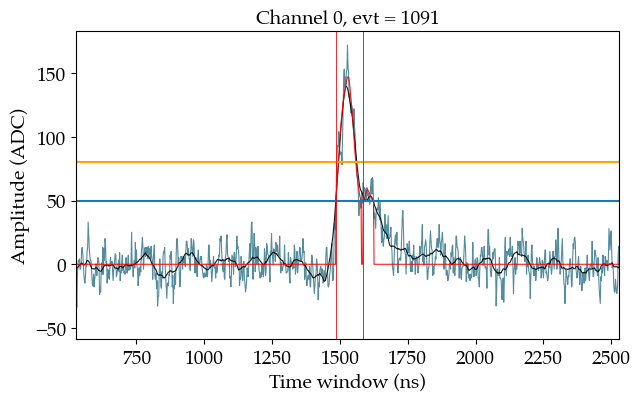

In [50]:
#for ievt in [19, 75, 151, 188, 397, 624, 747, 755, 868, 903, 969, 1056, 1085, 1092, 1094, 1209, 1210, 1345, 1351, 1370, 1371, 1447]:
for ievt,idxs in zip([8,10,14,20,27,29,42,49,54,66,67,73], [[1105., 1205.],[2634., 2689.],[6488., 6552.],[4569., 4737.],[  57., 6873.],[6250., 6303.],[3665., 3732.],[6926., 6982.],[7092., 7140.],[5739., 5807.],[3256., 3381.],[743., 793.]]):
    ch  = 0
    evt = filt_evts_dict[0][ievt]
    wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
    swf = pf.subtract_baseline(wf, mode=False, wf_range_bsl=(0, 650))
    fwf = savgol_filter(swf, window_length=50, polyorder=3)
    zfwf = zs_sg_filt_swfs_dict[ch][ievt]
    plt.figure(figsize=(7, 4))
    plt.plot(2*np.arange(len(swf)),  swf,  lw=0.8, color=fav_col, alpha=0.9)
    plt.plot(2*np.arange(len(fwf)),  fwf,  lw=0.8, color='k',     alpha=0.9)
    plt.plot(2*np.arange(len(zfwf)), zfwf, lw=0.8, color='r',     alpha=0.9)
    plt.axhline(50)
    plt.axhline(80, color='orange')
    for idx in idxs:
        plt.axvline(idx*2, color='r', lw=0.6)
    plt.title(f'Channel {ch}, evt = {evt}', fontsize=14)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.xlim(2*np.argmax(wf)-1000, 2*np.argmax(wf)+1000)
    plt.show()


## Analyze test files:

In [51]:
import glob

evts_path = '/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/'

thr_ADC1       = 50
thr_ADC2       = 80
sg_filt_window = 30
min_dist       = 15

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

files       = os.listdir(evts_path)
filt_files1 = sorted(glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC1}_mean_w{sg_filt_window}_dist{min_dist}_test_run-*'), key=extract_date_and_number)
filt_files2 = sorted(glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC2}_mean_w{sg_filt_window}_dist{min_dist}_test_run-*'), key=extract_date_and_number)

In [52]:
filt_evts_all1        = {}
idx_peak_thr_all1     = {}
idx_peak_thr_new_all1 = {}
idx_peak_all1         = {}
h_peak_sg_d_all1      = {}
h_peak_sg_d_new_all1  = {}

normal_chs = [8]

for filename in filt_files1:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_all1:
        print(date)
        filt_evts_all1       [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_thr_all1    [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch]) for ch in normal_chs}
        idx_peak_thr_new_all1[date] = {ch: np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch]) for ch in normal_chs}
        idx_peak_all1        [date] = {ch: np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_all1     [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_new_all1 [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch]) for ch in normal_chs}

    else:
        for ch in normal_chs:
            try:
                filt_evts_all1       [date][ch] = np.concatenate((filt_evts_all1       [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_thr_all1    [date][ch] = np.concatenate((idx_peak_thr_all1    [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch])))
                idx_peak_thr_new_all1[date][ch] = np.concatenate((idx_peak_thr_new_all1[date][ch], np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch])))
                idx_peak_all1        [date][ch] = np.concatenate((idx_peak_all1        [date][ch], np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch])))
                h_peak_sg_d_all1     [date][ch] = np.concatenate((h_peak_sg_d_all1     [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch])))
                h_peak_sg_d_new_all1 [date][ch] = np.concatenate((h_peak_sg_d_new_all1 [date][ch], np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


In [53]:
filt_evts_all2        = {}
idx_peak_thr_all2     = {}
idx_peak_thr_new_all2 = {}
idx_peak_all2         = {}
h_peak_sg_d_all2      = {}
h_peak_sg_d_new_all2  = {}

normal_chs = [8]

for filename in filt_files2:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_all2:
        print(date)
        filt_evts_all2       [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_thr_all2    [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch]) for ch in normal_chs}
        idx_peak_thr_new_all2[date] = {ch: np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch]) for ch in normal_chs}
        idx_peak_all2        [date] = {ch: np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_all2     [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_new_all2 [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch]) for ch in normal_chs}
    
    else:
        for ch in normal_chs:
            try:
                filt_evts_all2       [date][ch] = np.concatenate((filt_evts_all2       [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_thr_all2    [date][ch] = np.concatenate((idx_peak_thr_all2    [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch])))
                idx_peak_thr_new_all2[date][ch] = np.concatenate((idx_peak_thr_new_all2[date][ch], np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch])))
                idx_peak_all2        [date][ch] = np.concatenate((idx_peak_all2        [date][ch], np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch])))
                h_peak_sg_d_all2     [date][ch] = np.concatenate((h_peak_sg_d_all2     [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch])))
                h_peak_sg_d_new_all2 [date][ch] = np.concatenate((h_peak_sg_d_new_all2 [date][ch], np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


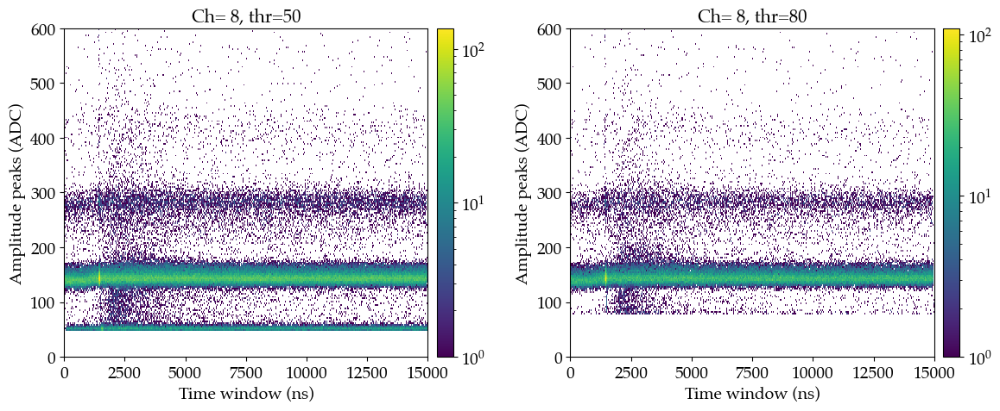

In [54]:
ch   = 8
date = '11_25_2024'

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))

fig0 = ax0.hist2d(2*idx_peak_thr_all1[date][ch], h_peak_sg_d_all1[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig1 = ax1.hist2d(2*idx_peak_thr_all2[date][ch], h_peak_sg_d_all2[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())

for j, (ax, fig00, thr_lab) in enumerate(zip([ax0, ax1], [fig0, fig1], [50, 80])):
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Ch= {ch}, thr={thr_lab}", fontsize=15)
    fig.colorbar(fig00[3], ax=ax, pad=0.02)

# Set overall title and layout
#plt.suptitle(f'Channel {ch}')
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_ch_{ch}_thr50_and_80.pdf', bbox_inches='tight')
plt.show()


In [55]:
min_dist2   = 50
files       = os.listdir(evts_path)
filt_files6 = sorted(glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC2}_mean_w{sg_filt_window}_dist{min_dist2}_test_run-*'), key=extract_date_and_number)

filt_evts_all3        = {}
idx_peak_thr_all3     = {}
idx_peak_thr_new_all3 = {}
idx_peak_all3         = {}
h_peak_sg_d_all3      = {}
h_peak_sg_d_new_all3  = {}

normal_chs = [8]

for filename in filt_files2:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_all3:
        print(date)
        filt_evts_all3       [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_thr_all3    [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch]) for ch in normal_chs}
        idx_peak_thr_new_all3[date] = {ch: np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch]) for ch in normal_chs}
        idx_peak_all3        [date] = {ch: np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_all3     [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_new_all3 [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch]) for ch in normal_chs}
    
    else:
        for ch in normal_chs:
            try:
                filt_evts_all3       [date][ch] = np.concatenate((filt_evts_all3       [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_thr_all3    [date][ch] = np.concatenate((idx_peak_thr_all3    [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']             .item()[ch])))
                idx_peak_thr_new_all3[date][ch] = np.concatenate((idx_peak_thr_new_all3[date][ch], np.concatenate(d['idx_peaks_thr_new_ch_dict']         .item()[ch])))
                idx_peak_all3        [date][ch] = np.concatenate((idx_peak_all3        [date][ch], np.concatenate(d['idx_peaks_ch_dict']                 .item()[ch])))
                h_peak_sg_d_all3     [date][ch] = np.concatenate((h_peak_sg_d_all3     [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_dict']    .item()[ch])))
                h_peak_sg_d_new_all3 [date][ch] = np.concatenate((h_peak_sg_d_new_all3 [date][ch], np.concatenate(d['height_peaks_sg_deconv_new_ch_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


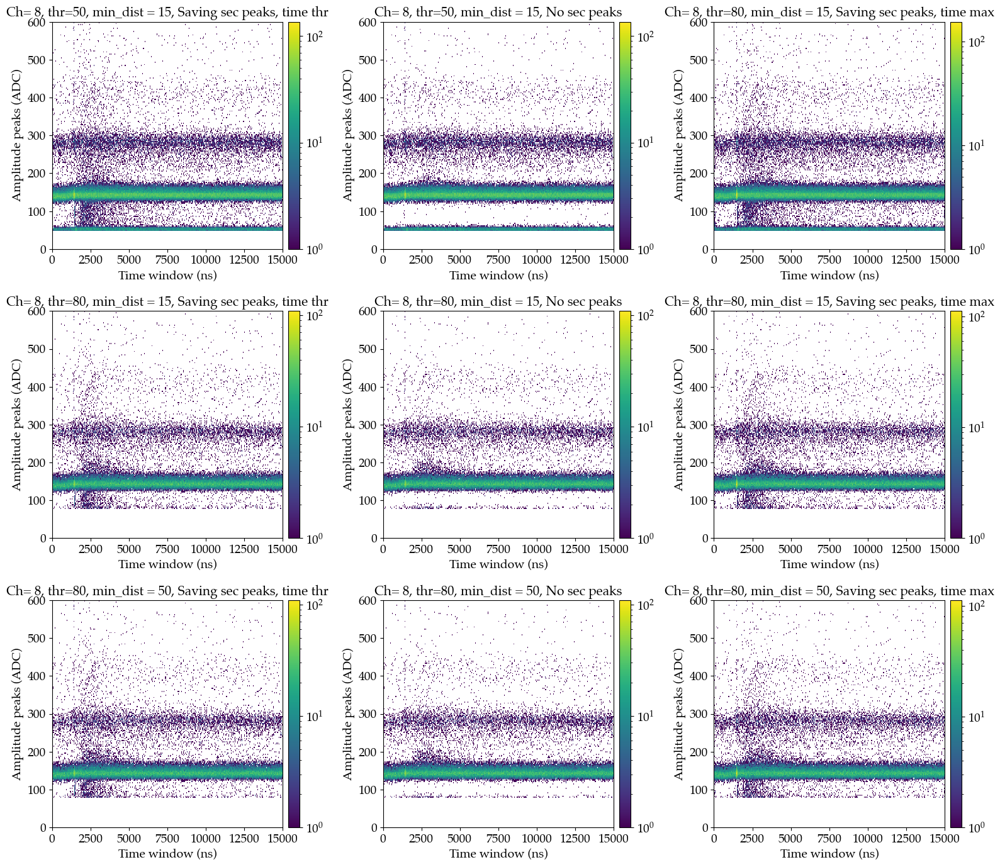

In [56]:
ch   = 8
date = '11_25_2024'

fig, axs = plt.subplots(3, 3, figsize=(16, 14))

fig0 = axs[0][0].hist2d(2*idx_peak_thr_all1    [date][ch], h_peak_sg_d_all1    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig1 = axs[0][1].hist2d(2*idx_peak_thr_new_all1[date][ch], h_peak_sg_d_new_all1[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig2 = axs[0][2].hist2d(2*idx_peak_all1        [date][ch], h_peak_sg_d_all1    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig3 = axs[1][0].hist2d(2*idx_peak_thr_all2    [date][ch], h_peak_sg_d_all2    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig4 = axs[1][1].hist2d(2*idx_peak_thr_new_all2[date][ch], h_peak_sg_d_new_all2[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig5 = axs[1][2].hist2d(2*idx_peak_all2        [date][ch], h_peak_sg_d_all2    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig6 = axs[2][0].hist2d(2*idx_peak_thr_all3    [date][ch], h_peak_sg_d_all3    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig7 = axs[2][1].hist2d(2*idx_peak_thr_new_all3[date][ch], h_peak_sg_d_new_all3[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
fig8 = axs[2][2].hist2d(2*idx_peak_all3        [date][ch], h_peak_sg_d_all3    [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())

for j, (ax, title, fig00) in enumerate(zip(axs.flatten(), 3*['Saving sec peaks, time thr', 'No sec peaks', 'Saving sec peaks, time max'], [fig0, fig1, fig2, fig3, fig4, fig5, fig6, fig7, fig8])):
    if j<2:
        thr_lab = 50
    else:
        thr_lab = 80
        
    if j>5:
        mdist = 50
    else:
        mdist = 15
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Ch= {ch}, thr={thr_lab}, min_dist = {mdist}, {title}", fontsize=15)
    fig.colorbar(fig00[3], ax=ax, pad=0.02)

# Set overall title and layout
#plt.suptitle(f'Channel {ch}')
plt.tight_layout()
plt.show()


## Pile-up events for the trigger SiPMs

754 [759 782] [1341.65321562 1177.04791575]


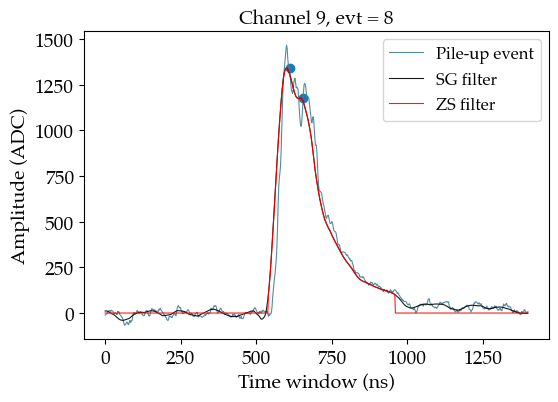

754 [756 804 944] [2017.47842478 1279.57856408  115.33361455]


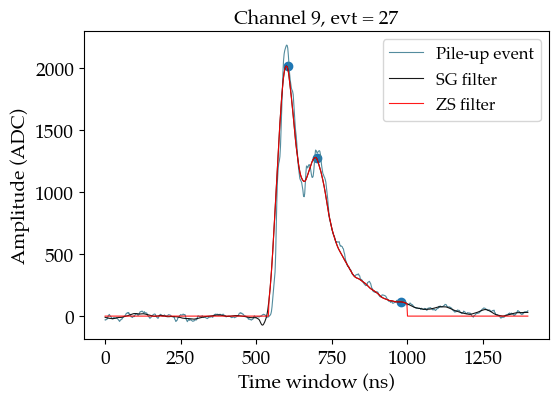

750 [ 752  801  903 1031] [2086.45746925 1031.02134652  171.16556869  730.61201195]


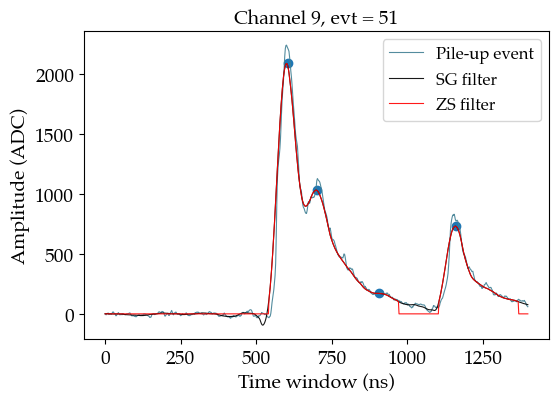

832 [755 832] [1411.3577195  1548.77842392]


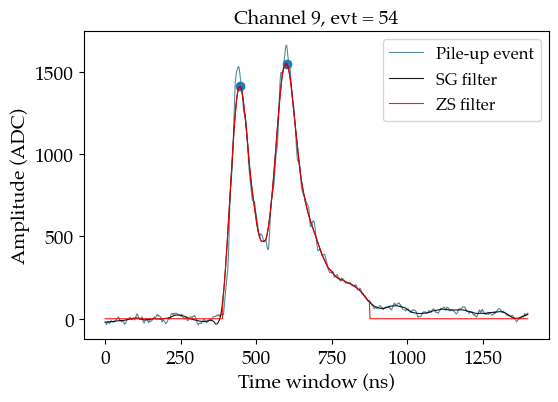

754 [756 782] [1310.01646384 1199.40470558]


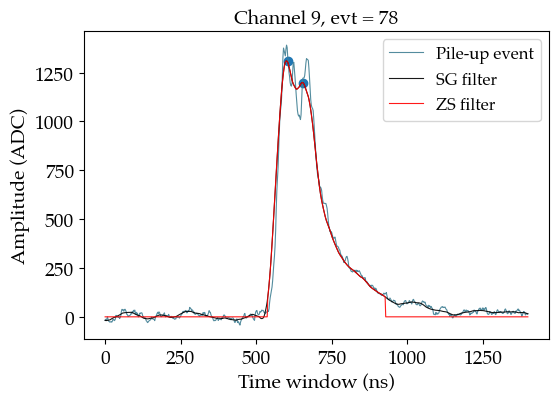

In [57]:
ch   = 9
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())[:1000]
swfs = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs])
    
max_swfs = np.max(swfs, axis=1)

for i, (wf, mxwf) in enumerate(zip(swfs[0:100], max_swfs[0:100])):
    if i in [8, 27, 51, 54, 78]:
        sgwf = savgol_filter(wf, window_length=50, polyorder=3)
        zwf  = pf.noise_suppression(sgwf, threshold=100)

        idx_peaks1 = pf.get_peaks_peakutils(zwf, thres=100, min_dist=15, thres_abs=True)
        idx_peaks2 = pf.get_values_thr_from_zswf(zwf, idx_peaks1)

        height_peaks1 = pf.peak_height(zwf, idx_peaks1)
        height_peaks2 = pf.peak_height_deconv(zwf, idx_peaks1, height_peaks1.copy(), thr=100)

        idx_peaks3 = pf.peak_height_deconv_indexes(zwf, idx_peaks1, height_peaks1.copy(), thr=100)

        print(np.argmax(wf), idx_peaks1, height_peaks1)
        plt.figure(figsize=(6, 4))
        plt.plot(2*np.arange(len(wf  [np.argmax(wf)  -300:np.argmax(wf)  +400])), wf  [np.argmax(wf)  -300:np.argmax(wf)  +400], lw=0.8, color=fav_col, alpha=0.9, label='Pile-up event')
        plt.plot(2*np.arange(len(sgwf[np.argmax(sgwf)-300:np.argmax(sgwf)+400])), sgwf[np.argmax(sgwf)-300:np.argmax(sgwf)+400], lw=0.8, color='k',     alpha=0.9, label='SG filter')
        plt.plot(2*np.arange(len(zwf [np.argmax(zwf) -300:np.argmax(zwf) +400])), zwf [np.argmax(zwf) -300:np.argmax(zwf) +400], lw=0.8, color='r',     alpha=0.9, label='ZS filter')
        plt.scatter(2*(idx_peaks1-np.argmax(wf)+300), height_peaks1)
        plt.title(f'Channel {ch}, evt = {i}', fontsize=14)
        plt.xlabel('Time window (ns)', fontsize=14)
        plt.ylabel('Amplitude (ADC)',  fontsize=14)
        plt.legend(fontsize=12)
        plt.show()

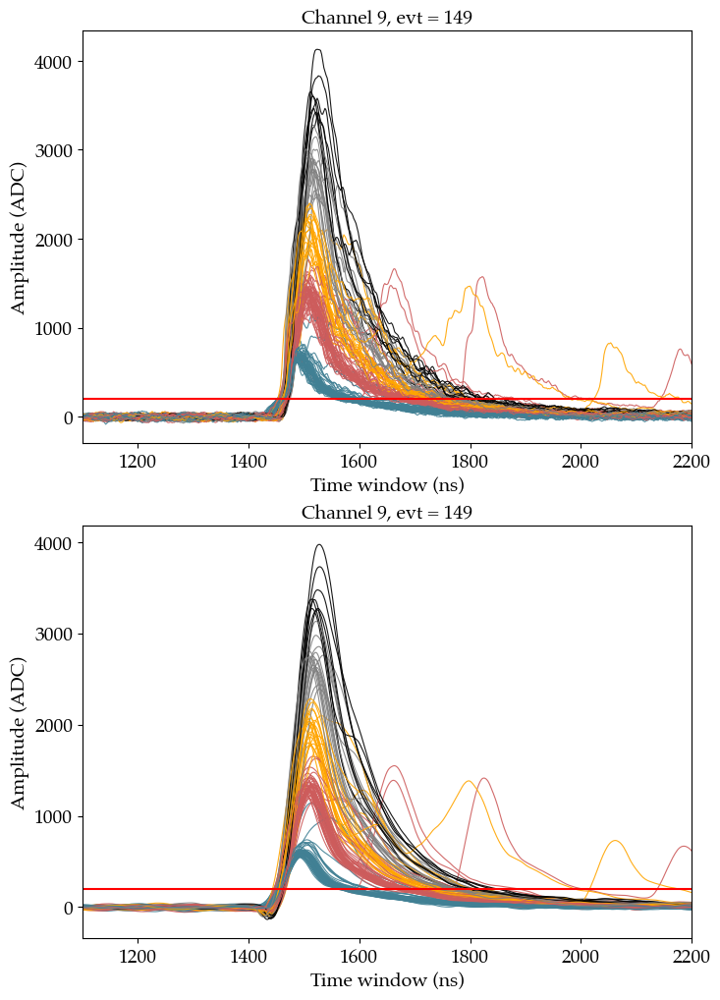

In [58]:
ch   = 9
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())[:1000]
swfs = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs])
    
max_swfs = np.max(swfs, axis=1)

fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(8, 12))
for i, (wf, mxwf) in enumerate(zip(swfs[0:150], max_swfs[0:150])):
    sgwf = savgol_filter(wf, window_length=50, polyorder=3)
    
    if np.max(wf[500:1200])>500 and np.max(wf[500:1200])<1200:
        col = fav_col
    elif np.max(wf[500:1200])>1200 and np.max(wf[500:1200])<1800:
        col = 'indianred'
    elif np.max(wf[500:1200])>1800 and np.max(wf[500:1200])<2500:
        col = 'orange'
    elif np.max(wf[500:1200])>2500 and np.max(wf[500:1200])<3300:
        col = 'grey'
    elif np.max(wf[500:1200])>3300 and np.max(wf[500:1200])<4200:
        col = 'k'
    else:
        continue

    ax0.plot(2*np.arange(len(wf)),   wf,   lw=0.8, color=col, alpha=0.9, label='Pile-up event')
    ax1.plot(2*np.arange(len(sgwf)), sgwf, lw=0.8, color=col, alpha=0.9, label='SG filter')

for ax in [ax0, ax1]:
    ax.axhline(200, color='r')
    ax.set_title(f'Channel {ch}, evt = {i}', fontsize=14)
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=14)
    ax.set_xlim(1100, 2200)
    #ax.set_ylim(500, 2000)
plt.show()

In [59]:
idx_peak_thr_ch9     = {}
idx_peak_thr_new_ch9 = {}
idx_peak_ch9         = {}
h_peak_sg_d_ch9      = {}
h_peak_sg_d_new_ch9  = {}

trigger_chs = [9]

for filename in filt_files1:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in idx_peak_thr_ch9:
        print(date)
        idx_peak_thr_ch9    [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']             .item()[ch]) for ch in trigger_chs}
        idx_peak_thr_new_ch9[date] = {ch: np.concatenate(d['idx_peaks_thr_new_ch_trigg_dict']         .item()[ch]) for ch in trigger_chs}
        idx_peak_ch9        [date] = {ch: np.concatenate(d['idx_peaks_ch_trigg_dict']                 .item()[ch]) for ch in trigger_chs}
        h_peak_sg_d_ch9     [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict']    .item()[ch]) for ch in trigger_chs}
        h_peak_sg_d_new_ch9 [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_new_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        
    else:
        for ch in trigger_chs:
            try:
                idx_peak_thr_ch9    [date][ch] = np.concatenate((idx_peak_thr_ch9    [date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']             .item()[ch])))
                idx_peak_thr_new_ch9[date][ch] = np.concatenate((idx_peak_thr_new_ch9[date][ch], np.concatenate(d['idx_peaks_thr_new_ch_trigg_dict']         .item()[ch])))
                idx_peak_ch9        [date][ch] = np.concatenate((idx_peak_ch9        [date][ch], np.concatenate(d['idx_peaks_ch_trigg_dict']                 .item()[ch])))
                h_peak_sg_d_ch9     [date][ch] = np.concatenate((h_peak_sg_d_ch9     [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict']    .item()[ch])))
                h_peak_sg_d_new_ch9 [date][ch] = np.concatenate((h_peak_sg_d_new_ch9 [date][ch], np.concatenate(d['height_peaks_sg_deconv_new_ch_trigg_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


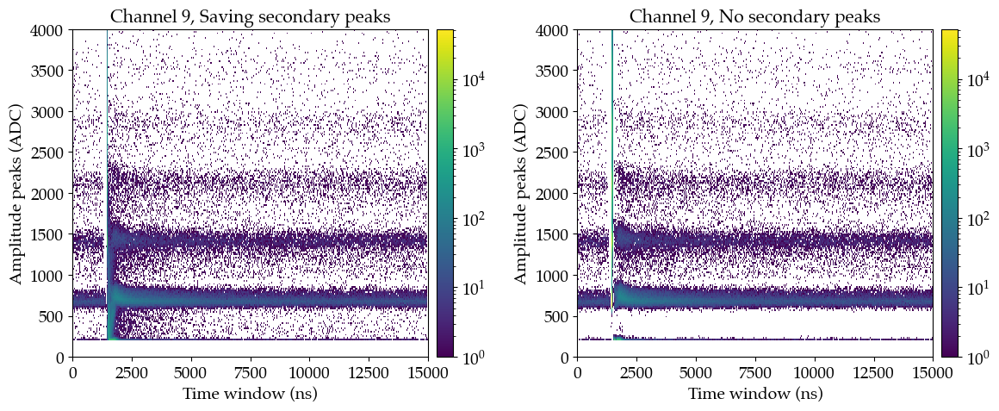

In [60]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))



for ax, title, idxs, hs in zip(axs.flatten(), ['Saving secondary peaks', 'No secondary peaks'],
                                           [2*idx_peak_thr_ch9[date][ch], 2*idx_peak_thr_new_ch9[date][ch]],
                                           [h_peak_sg_d_ch9[date][ch], h_peak_sg_d_new_ch9 [date][ch]]):
    fig0 = ax.hist2d(idxs, hs, bins=(500, 200), range=((0, 15000), (0, 4000)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

# Set overall title and layout
#plt.suptitle(f'Channel {ch}')
plt.tight_layout()
plt.show()


#### Using min_dist = 50 time samples

In [61]:
idx_peak_thr_ch9_2     = {}
idx_peak_thr_new_ch9_2 = {}
idx_peak_ch9_2         = {}
h_peak_sg_d_ch9_2      = {}
h_peak_sg_d_new_ch9_2  = {}

trigger_chs = [9]

for filename in filt_files6:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in idx_peak_thr_ch9_2:
        print(date)
        idx_peak_thr_ch9_2    [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']             .item()[ch]) for ch in trigger_chs}
        idx_peak_thr_new_ch9_2[date] = {ch: np.concatenate(d['idx_peaks_thr_new_ch_trigg_dict']         .item()[ch]) for ch in trigger_chs}
        idx_peak_ch9_2        [date] = {ch: np.concatenate(d['idx_peaks_ch_trigg_dict']                 .item()[ch]) for ch in trigger_chs}
        h_peak_sg_d_ch9_2     [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict']    .item()[ch]) for ch in trigger_chs}
        h_peak_sg_d_new_ch9_2 [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_new_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        
    else:
        for ch in trigger_chs:
            try:
                idx_peak_thr_ch9_2    [date][ch] = np.concatenate((idx_peak_thr_ch9_2    [date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']             .item()[ch])))
                idx_peak_thr_new_ch9_2[date][ch] = np.concatenate((idx_peak_thr_new_ch9_2[date][ch], np.concatenate(d['idx_peaks_thr_new_ch_trigg_dict']         .item()[ch])))
                idx_peak_ch9_2        [date][ch] = np.concatenate((idx_peak_ch9_2        [date][ch], np.concatenate(d['idx_peaks_ch_trigg_dict']                 .item()[ch])))
                h_peak_sg_d_ch9_2     [date][ch] = np.concatenate((h_peak_sg_d_ch9_2     [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict']    .item()[ch])))
                h_peak_sg_d_new_ch9_2 [date][ch] = np.concatenate((h_peak_sg_d_new_ch9_2 [date][ch], np.concatenate(d['height_peaks_sg_deconv_new_ch_trigg_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


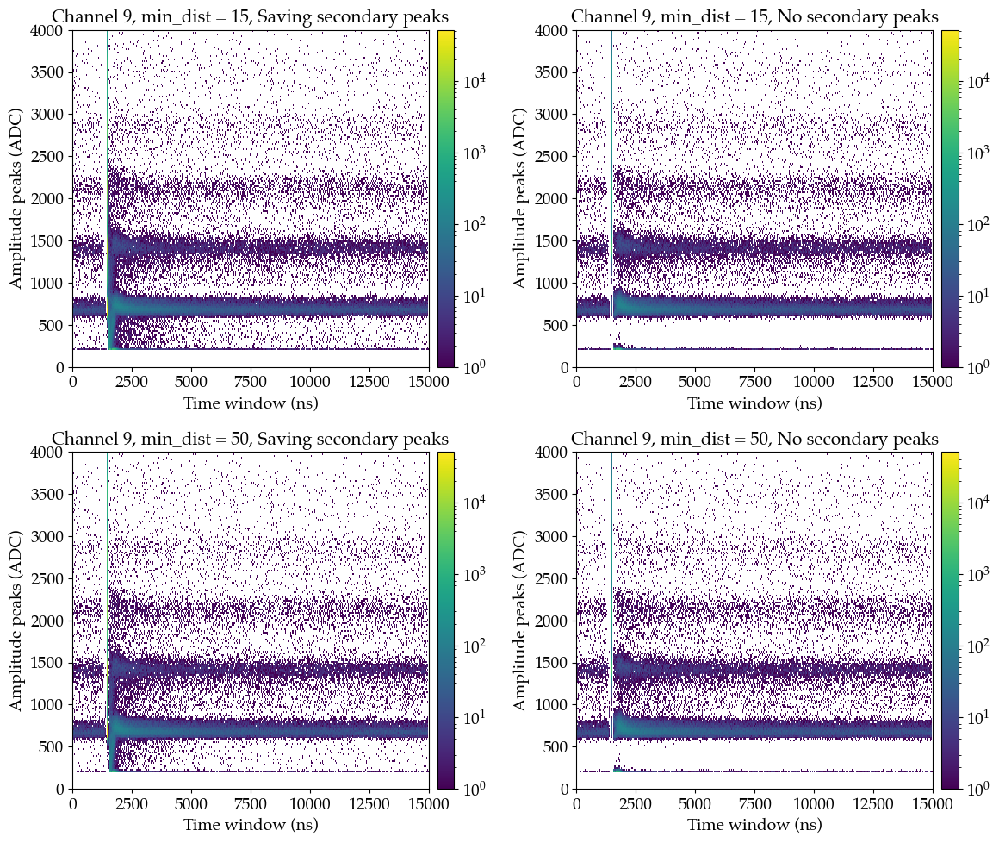

In [62]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(2, 2, figsize=(12, 10))



for ax, mdist, title, idxs, hs in zip(axs.flatten(), [15, 15, 50, 50], 2*['Saving secondary peaks', 'No secondary peaks'],
                                           [2*idx_peak_thr_ch9  [date][ch], 2*idx_peak_thr_new_ch9  [date][ch],
                                            2*idx_peak_thr_ch9_2[date][ch], 2*idx_peak_thr_new_ch9_2[date][ch]],
                                           [h_peak_sg_d_ch9  [date][ch], h_peak_sg_d_new_ch9  [date][ch],
                                            h_peak_sg_d_ch9_2[date][ch], h_peak_sg_d_new_ch9_2[date][ch]]):
    fig0 = ax.hist2d(idxs, hs, bins=(500, 200), range=((0, 15000), (0, 4000)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, min_dist = {mdist}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

# Set overall title and layout
#plt.suptitle(f'Channel {ch}')
plt.tight_layout()
plt.show()


## Study only the secondary peaks in the pile-up events

In [63]:
filt_files3 = sorted(glob.glob(evts_path + f'/BACoN_run3_pile_up_evts_thr{thr_ADC1}_mean_w{sg_filt_window}_dist{min_dist}_run-*'), key=extract_date_and_number)

idx_peak_sec_ch8   = {}
h_peak_sec_abs_ch8 = {}
h_peak_sec_rel_ch8 = {}

idx_peak_sec_ch9   = {}
h_peak_sec_abs_ch9 = {}
h_peak_sec_rel_ch9 = {}

for filename in filt_files3:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in idx_peak_sec_ch8:
        print(date)
        idx_peak_sec_ch8  [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_sec_ch_dict']       .item()[ch]) for ch in normal_chs}
        h_peak_sec_abs_ch8[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch]) for ch in normal_chs}
        h_peak_sec_rel_ch8[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch]) for ch in normal_chs}
    
    else:
        for ch in normal_chs:
            try:
                idx_peak_sec_ch8  [date][ch] = np.concatenate((idx_peak_sec_ch8  [date][ch], np.concatenate(d['idx_peaks_sg_deconv_sec_ch_dict']       .item()[ch])))
                h_peak_sec_abs_ch8[date][ch] = np.concatenate((h_peak_sec_abs_ch8[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch])))
                h_peak_sec_rel_ch8[date][ch] = np.concatenate((h_peak_sec_rel_ch8[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
            
    if date not in idx_peak_sec_ch9:
        print(date)
        idx_peak_sec_ch9  [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_sec_ch_trigg_dict']       .item()[ch]) for ch in trigger_chs}
        h_peak_sec_abs_ch9[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        h_peak_sec_rel_ch9[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        
    else:
        for ch in trigger_chs:
            try:
                idx_peak_sec_ch9  [date][ch] = np.concatenate((idx_peak_sec_ch9  [date][ch], np.concatenate(d['idx_peaks_sg_deconv_sec_ch_trigg_dict']       .item()[ch])))
                h_peak_sec_abs_ch9[date][ch] = np.concatenate((h_peak_sec_abs_ch9[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch])))
                h_peak_sec_rel_ch9[date][ch] = np.concatenate((h_peak_sec_rel_ch9[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024
11_25_2024


In [64]:
idx_peak_sec_ch8

{'11_25_2024': {8: array([6707., 6488., 6820., ...,  802., 5071., 3253.])}}

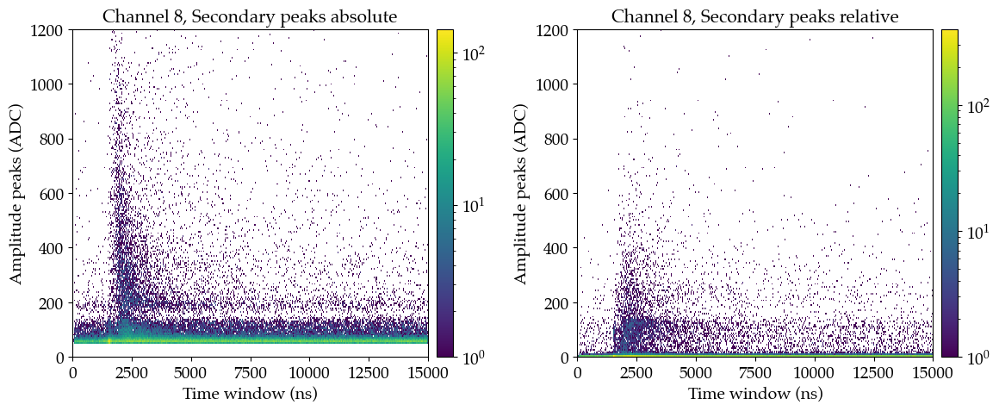

In [65]:
ch   = 8
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec_abs_ch8[date][ch], h_peak_sec_rel_ch8[date][ch]]):
    fig0 = ax.hist2d(2*idx_peak_sec_ch8[date][ch], hs, bins=(500, 200), range=((0, 15000), (0, 1200)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

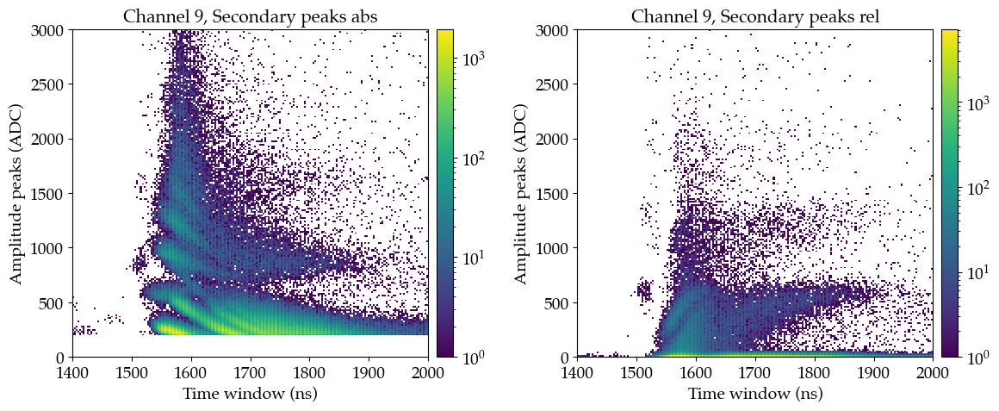

In [66]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec_abs_ch9[date][ch], h_peak_sec_rel_ch9[date][ch]]):
    fig0 = ax.hist2d(2*idx_peak_sec_ch9[date][ch], hs, bins=(200, 200), range=((1400, 2000), (0, 3000)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

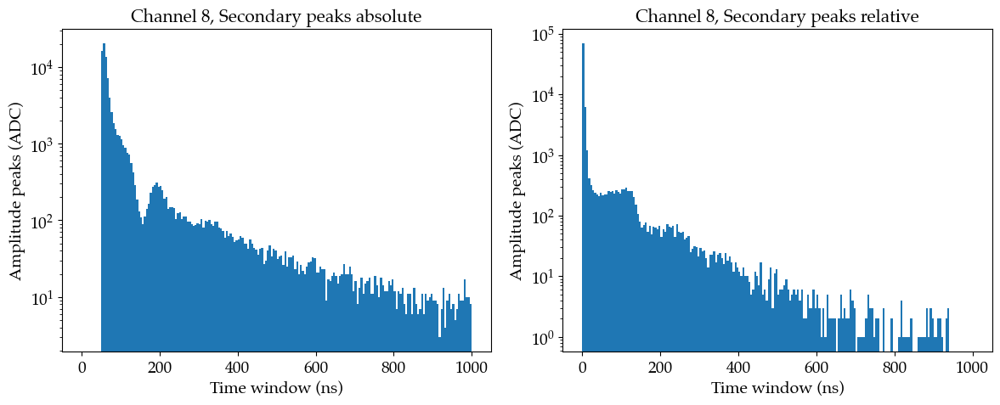

In [67]:
ch   = 8
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec_abs_ch8[date][ch], h_peak_sec_rel_ch8[date][ch]]):
    ax.hist(hs, bins=200, range=(0, 1000), log=True)
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)

plt.tight_layout()
plt.show()

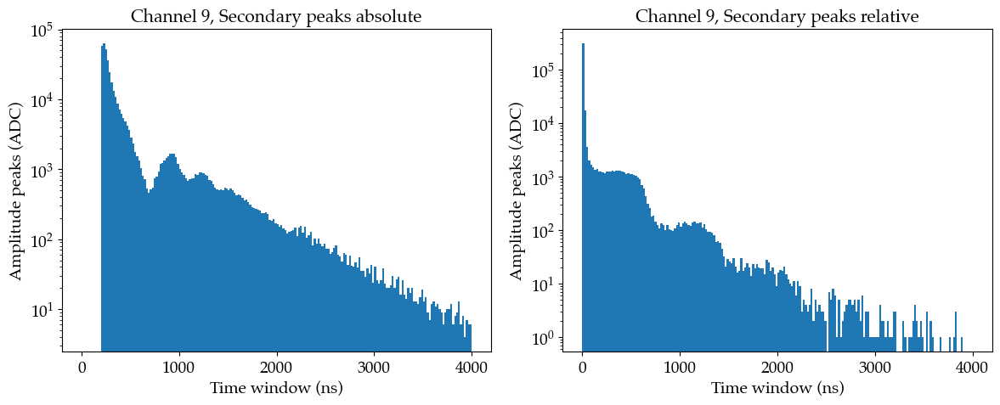

In [68]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec_abs_ch9[date][ch], h_peak_sec_rel_ch9[date][ch]]):
    ax.hist(hs, bins=200, range=(0, 4000), log=True)
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)

plt.tight_layout()
plt.show()

## Check the distance between peaks

In [69]:
filt_evts_test   = {}
idx_peak_test    = {}
h_peak_sg_d_test = {}

normal_chs = [8]

for filename in filt_files1:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_test:
        print(date)
        filt_evts_test  [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_test   [date] = {ch: d['idx_peaks_ch_dict']             .item()[ch] for ch in normal_chs}
        h_peak_sg_d_test[date] = {ch: d['height_peaks_sg_deconv_ch_dict'].item()[ch] for ch in normal_chs}
        
    else:
        for ch in normal_chs:
            try:
                filt_evts_test  [date][ch] = np.concatenate((filt_evts_test  [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_test   [date][ch] = np.concatenate((idx_peak_test   [date][ch], d['idx_peaks_ch_dict']             .item()[ch]))
                h_peak_sg_d_test[date][ch] = np.concatenate((h_peak_sg_d_test[date][ch], d['height_peaks_sg_deconv_ch_dict'].item()[ch]))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


In [70]:
filt_evts_test2   = {}
idx_peak_test2    = {}
h_peak_sg_d_test2 = {}

normal_chs = [8]

for filename in filt_files2:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_test2:
        print(date)
        filt_evts_test2  [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_test2   [date] = {ch: d['idx_peaks_ch_dict']             .item()[ch] for ch in normal_chs}
        h_peak_sg_d_test2[date] = {ch: d['height_peaks_sg_deconv_ch_dict'].item()[ch] for ch in normal_chs}
        
    else:
        for ch in normal_chs:
            try:
                filt_evts_test2  [date][ch] = np.concatenate((filt_evts_test2  [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_test2   [date][ch] = np.concatenate((idx_peak_test2   [date][ch], d['idx_peaks_ch_dict']             .item()[ch]))
                h_peak_sg_d_test2[date][ch] = np.concatenate((h_peak_sg_d_test2[date][ch], d['height_peaks_sg_deconv_ch_dict'].item()[ch]))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024


In [71]:
diff_dist_peaks = np.array([np.diff(el) for el in idx_peak_test[date][ch] if len(el)>1], dtype=object)

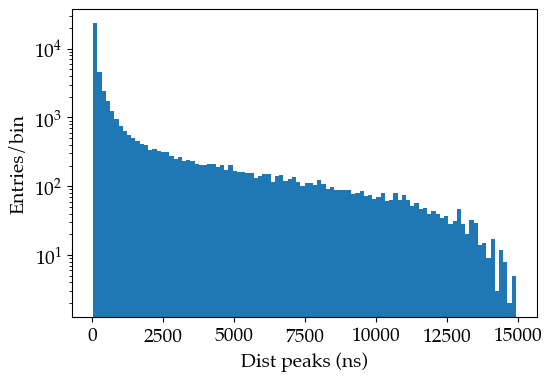

In [72]:
plt.figure(figsize=(6, 4))
plt.hist(2*np.concatenate(diff_dist_peaks), bins=100, log=True)
plt.xlabel('Dist peaks (ns)')
plt.ylabel('Entries/bin')
plt.show()

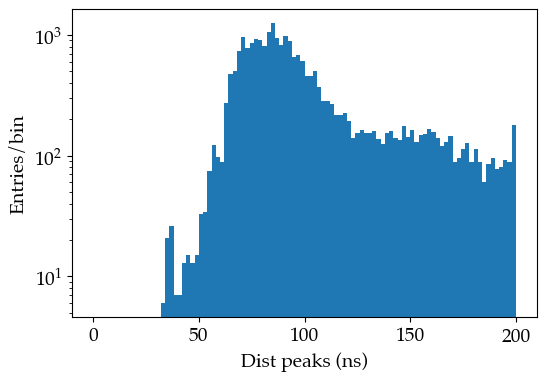

In [73]:
plt.figure(figsize=(6, 4))
plt.hist(2*np.concatenate(diff_dist_peaks), bins=100, range=(0, 200), log=True)
plt.xlabel('Dist peaks (ns)')
plt.ylabel('Entries/bin')
plt.show()

In [74]:
def plot_wf_given_evt_id(evt_id, ch, date, idxs, hs, idist=50, fdist=100, savefig=False):
    fnum = np.int64(evt_id/1000000)
    if fnum == 0:
        filename = f'/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-{date}-file.root'
    else:
        filename = f'/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-{date}-file_{fnum}.root'
    infile    = uproot.open(filename)
    RawTree   = infile['RawTree']
    evt       = evt_id - fnum*1000000
    wf        = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
    swf       = pf.subtract_baseline(wf, mode=False, wf_range_bsl=(0, 650))
    sgwf      = savgol_filter(swf, window_length=30, polyorder=3)
    diff_idxs = 2*np.diff(idxs)

    for ii,(i,h) in enumerate(zip(idxs, hs)):
        try:
            if 2*(idxs[ii+1]-idxs[ii])>idist and 2*(idxs[ii+1]-idxs[ii])<fdist:
                plt.figure(figsize=(6, 4))
                plt.plot(2*np.arange(len(swf)),  swf,  lw=0.8, color=fav_col, alpha=0.9)
                plt.plot(2*np.arange(len(sgwf)), sgwf, lw=0.8, color='k',     alpha=0.9)
                plt.axvline(2*idxs[ii], color='r', label='peak1')
                plt.axvline(2*idxs[ii+1], label='peak2')
                plt.title(f'Channel {ch}, evt = {evt}, dist between peaks = {2*(idxs[ii+1]-idxs[ii])} ns', fontsize=14)
                plt.xlabel('Time window (ns)', fontsize=14)
                plt.ylabel('Amplitude (ADC)',  fontsize=14)
                plt.xlim(2*idxs[ii]-1000, 2*idxs[ii]+1200)
                plt.legend()
                if savefig:
                    plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/pile_up_evt_{evt_id}_ch{ch}.pdf', bbox_inches='tight')
                plt.show()
        except IndexError:
            continue

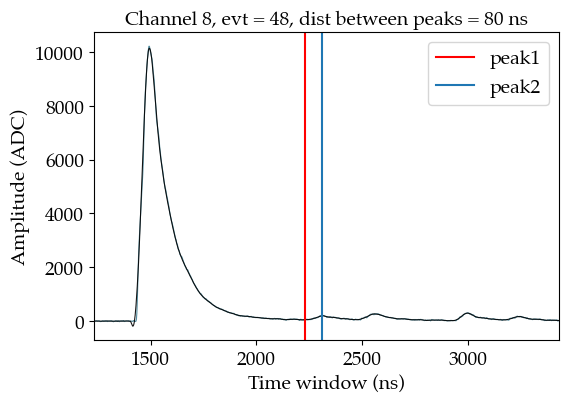

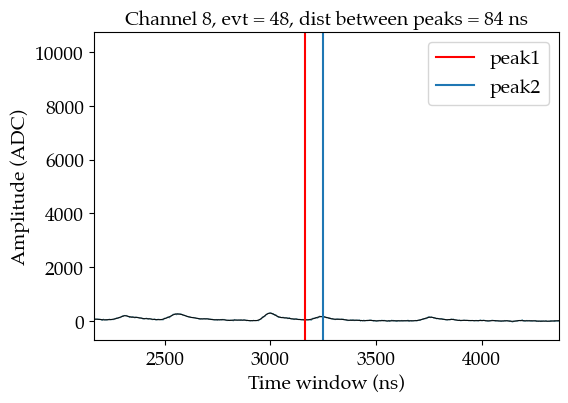

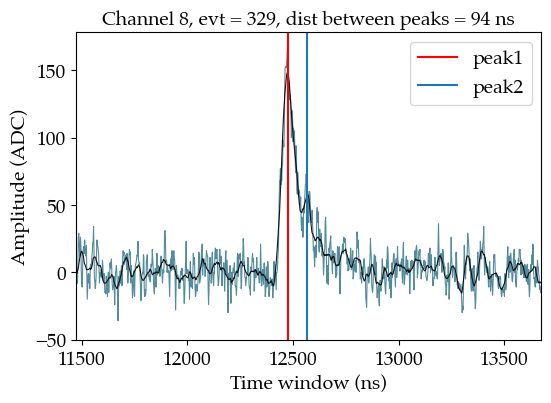

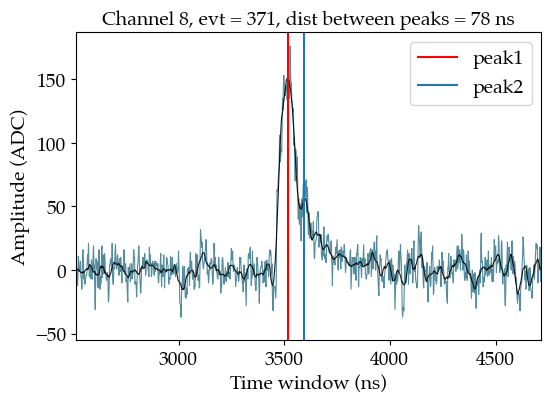

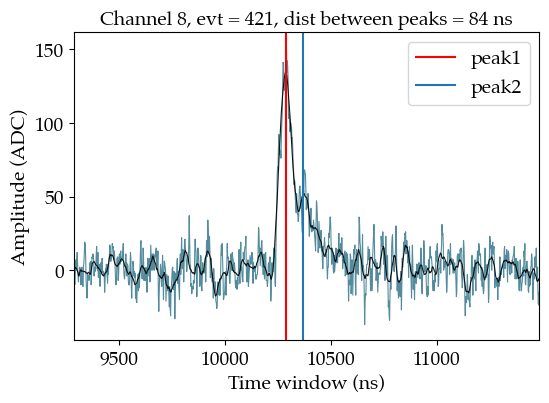

...

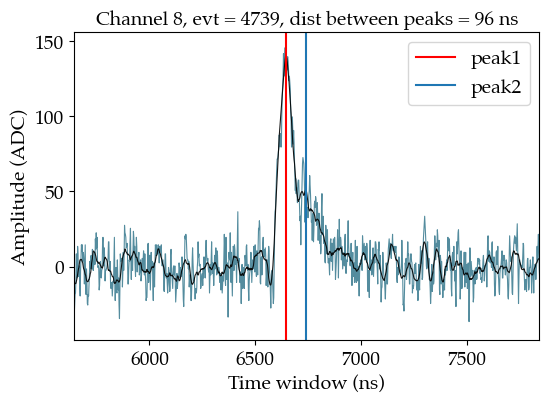

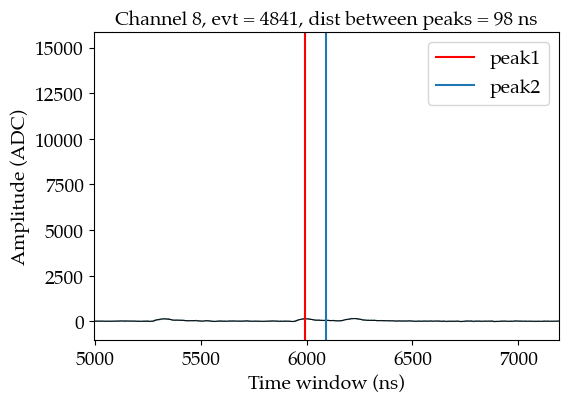

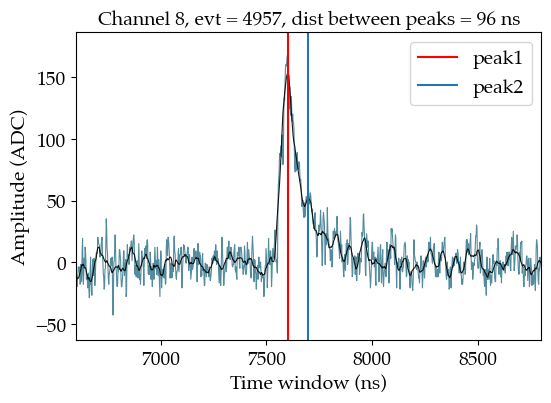

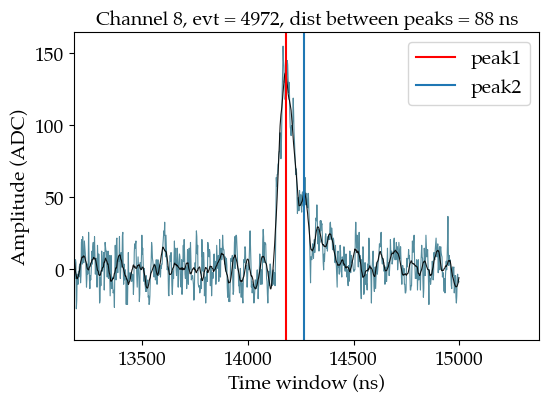

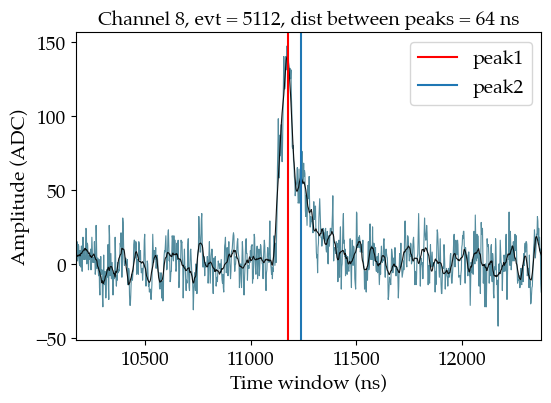

In [75]:
ch    = 8
date  = '11_25_2024'
idist = 50
fdist = 100
for evt, idx_evt, h_evt in zip(filt_evts_test[date][ch], idx_peak_test[date][ch], h_peak_sg_d_test[date][ch]):
    diff_d_peaks_evt = 2*np.diff(idx_evt)
    if np.any(diff_d_peaks_evt>idist) and np.any(diff_d_peaks_evt<fdist):
        if evt in [329, 1053, 1420]:
            savefig = True
        else:
            savefig = False
        plot_wf_given_evt_id(evt, ch, date, idx_evt, h_evt, idist=idist, fdist=fdist, savefig=savefig)
        if evt>5000:
            break

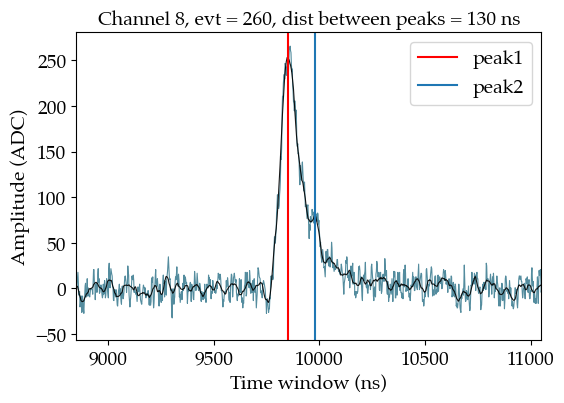

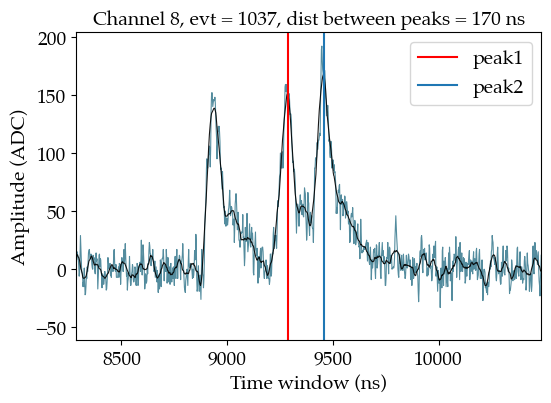

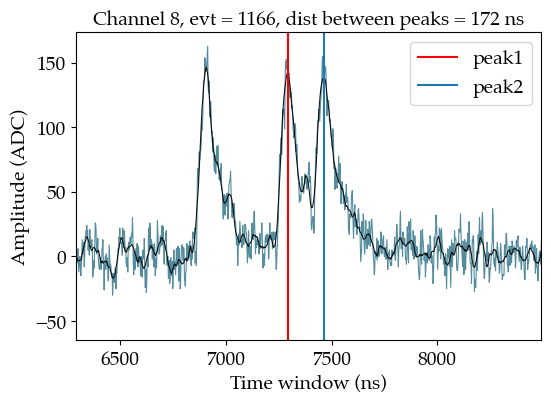

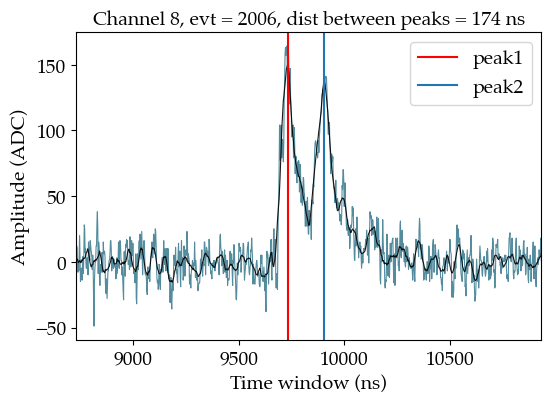

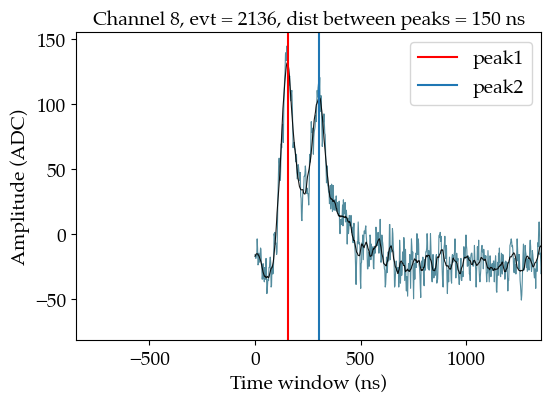

...

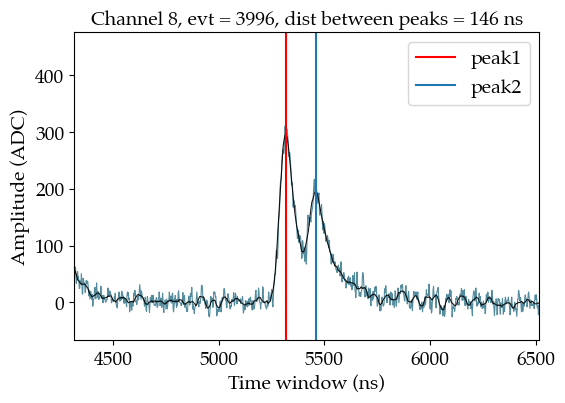

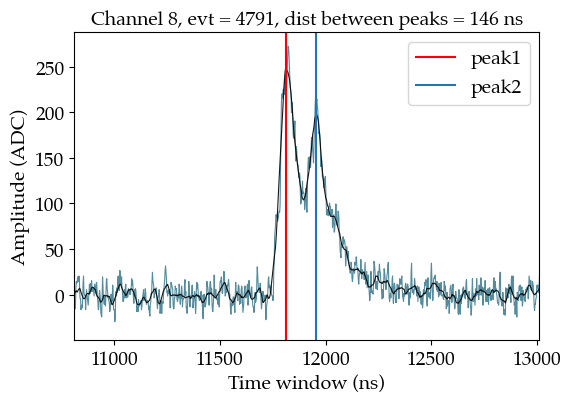

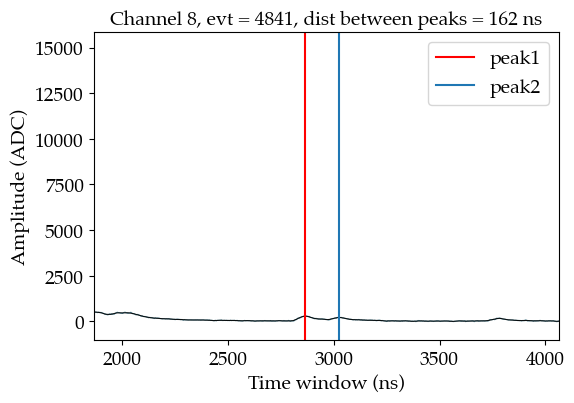

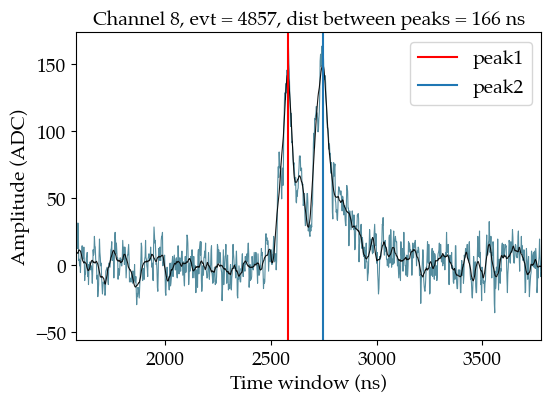

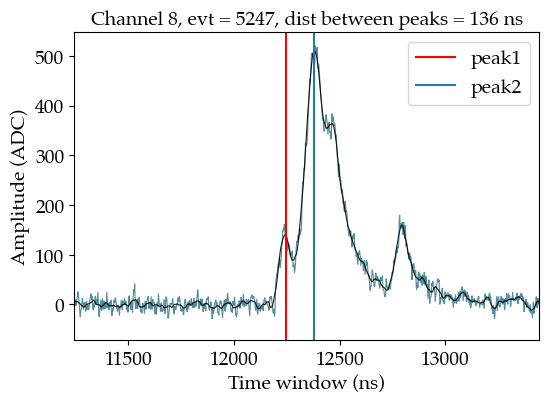

In [76]:
ch    = 8
date  = '11_25_2024'
idist = 100
fdist = 200
for evt, idx_evt, h_evt in zip(filt_evts_test2[date][ch], idx_peak_test2[date][ch], h_peak_sg_d_test2[date][ch]):
    diff_d_peaks_evt = 2*np.diff(idx_evt)
    if np.any(diff_d_peaks_evt>idist) and np.any(diff_d_peaks_evt<fdist):
        if evt in [260, 1037, 3888, 4857, 5247]:
            savefig = True
        else:
            savefig = False
        plot_wf_given_evt_id(evt, ch, date, idx_evt, h_evt, idist=idist, fdist=fdist, savefig=savefig)
        if evt>5000:
            break

## Secondary peaks in the pile-up events with thr=80 and min_dist = 50

In [80]:
min_dist2   = 50
filt_files4 = sorted(glob.glob(evts_path + f'/BACoN_run3_pile_up_evts_thr{thr_ADC2}_mean_w{sg_filt_window}_dist{min_dist2}_run-*'), key=extract_date_and_number)

filt_evts_chs       = {}
idx_peak_sec2_chs   = {}
h_peak_sec2_abs_chs = {}
h_peak_sec2_rel_chs = {}

trigger_times_all     = {}
idx_peak_sec2_trigg   = {}
h_peak_sec2_abs_trigg = {}
h_peak_sec2_rel_trigg = {}

for filename in filt_files4:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_chs:
        print(date)
        filt_evts_chs      [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_sec2_chs  [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_sec_ch_dict']       .item()[ch]) for ch in normal_chs}
        h_peak_sec2_abs_chs[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch]) for ch in normal_chs}
        h_peak_sec2_rel_chs[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch]) for ch in normal_chs}
    
    else:
        for ch in normal_chs:
            try:
                filt_evts_chs      [date][ch] = np.concatenate((filt_evts_chs      [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peak_sec2_chs  [date][ch] = np.concatenate((idx_peak_sec2_chs  [date][ch], np.concatenate(d['idx_peaks_sg_deconv_sec_ch_dict']       .item()[ch])))
                h_peak_sec2_abs_chs[date][ch] = np.concatenate((h_peak_sec2_abs_chs[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch])))
                h_peak_sec2_rel_chs[date][ch] = np.concatenate((h_peak_sec2_rel_chs[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
            
    if date not in trigger_times_all:
        print(date)
        trigger_times_all    [date] = {ch: d['trigger_samp_dict'].item()[ch] for ch in trigger_chs}
        idx_peak_sec2_trigg  [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_sec_ch_trigg_dict']       .item()[ch]) for ch in trigger_chs}
        h_peak_sec2_abs_trigg[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        h_peak_sec2_rel_trigg[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        
    else:
        for ch in trigger_chs:
            try:
                trigger_times_all    [date][ch] = np.concatenate((trigger_times_all    [date][ch], d['trigger_samp_dict'].item()[ch]))
                idx_peak_sec2_trigg  [date][ch] = np.concatenate((idx_peak_sec2_trigg  [date][ch], np.concatenate(d['idx_peaks_sg_deconv_sec_ch_trigg_dict']       .item()[ch])))
                h_peak_sec2_abs_trigg[date][ch] = np.concatenate((h_peak_sec2_abs_trigg[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch])))
                h_peak_sec2_rel_trigg[date][ch] = np.concatenate((h_peak_sec2_rel_trigg[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024
11_25_2024


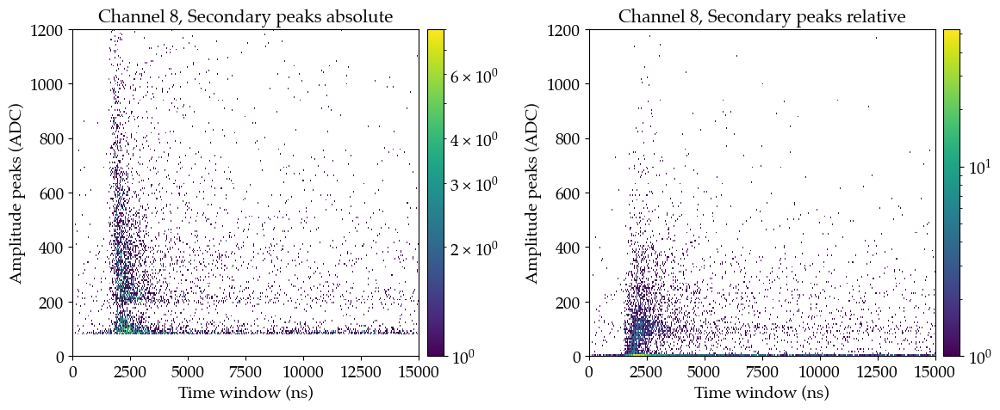

In [81]:
ch   = 8
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec2_abs_chs[date][ch], h_peak_sec2_rel_chs[date][ch]]):
    fig0 = ax.hist2d(2*idx_peak_sec2_chs[date][ch], hs, bins=(500, 200), range=((0, 15000), (0, 1200)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

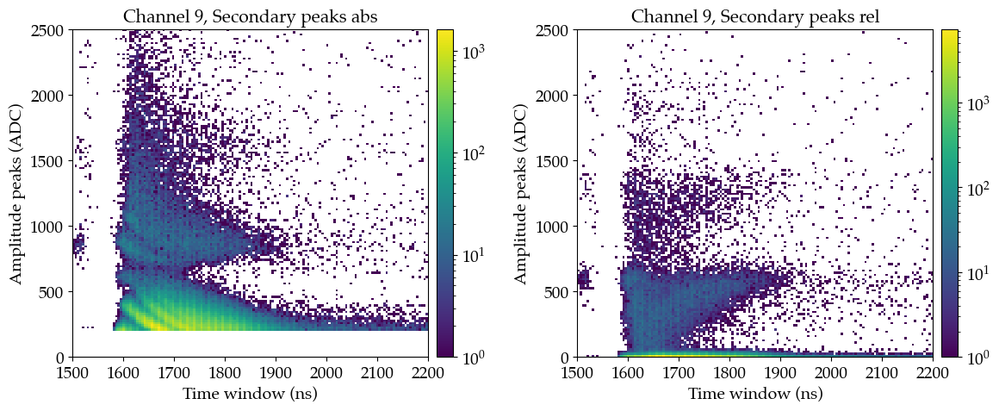

In [82]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec2_abs_trigg[date][ch], h_peak_sec2_rel_trigg[date][ch]]):
    fig0 = ax.hist2d(2*idx_peak_sec2_trigg[date][ch], hs, bins=(150, 150), range=((1500, 2200), (0, 2500)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

## Get the trigger time

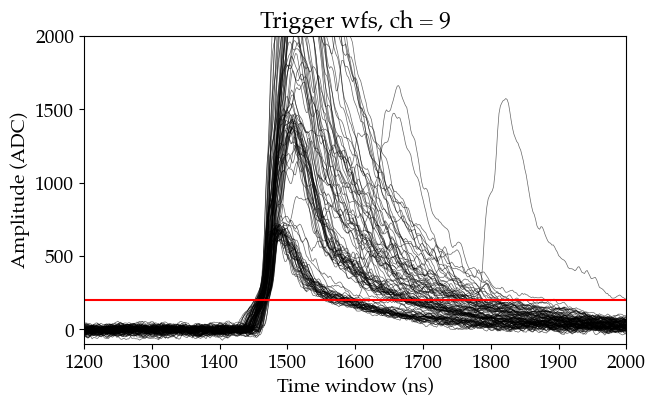

In [83]:
sel_ch = 9
wfs    = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[:100]
swfs   = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs])
fig    = plt.figure(figsize=(7, 4))
for i, wf in enumerate(swfs):
    plt.plot(2*np.arange(len(wf)), wf, lw=0.5, color='k', alpha=0.6)
    
plt.axhline(200, color='r')
plt.title(f'Trigger wfs, ch = {sel_ch}')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.xlim(1200, 2000)
plt.ylim(-100, 2000)   
plt.show()

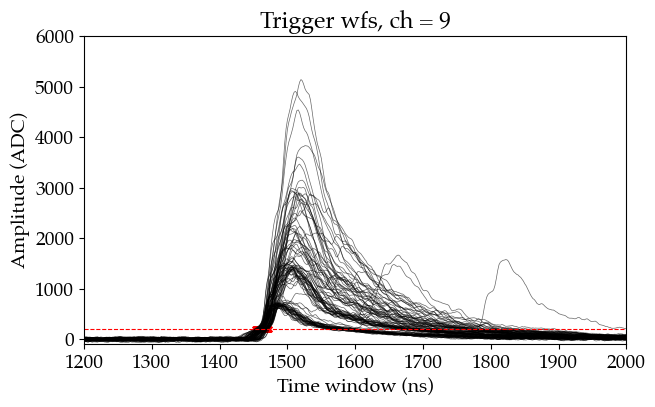

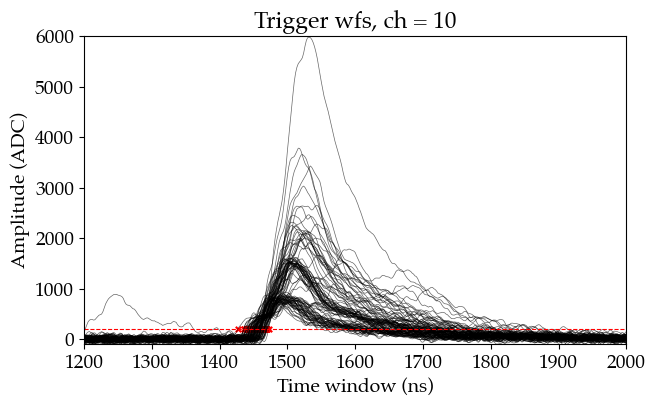

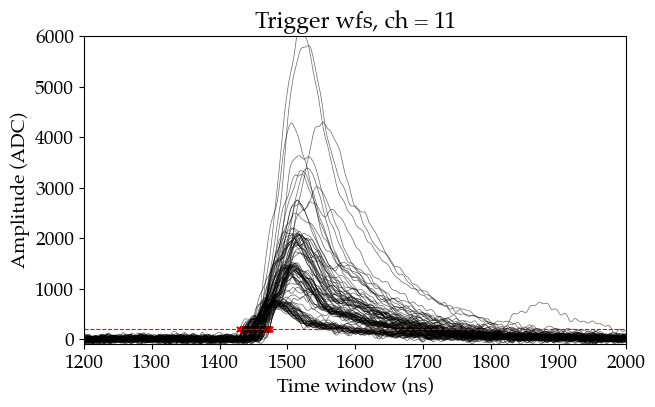

In [84]:
trigg_t_chs   = {}
max_trigg_chs = {}
for sel_ch in [9, 10, 11]:
    wfs    = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
    swfs   = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, 650), std_lim=30) for wf in wfs])
    fig    = plt.figure(figsize=(7, 4))
    
    trigg_t   = []
    max_trigg = []
    for i, wf in enumerate(swfs):
        wf_x      = 2*np.arange(len(wf))
        swfs_rng_t  = (1400, 1530)
        swfs_rng_m  = (1450, 1560)
        sel_swf_x_t = wf_x[(wf_x > swfs_rng_t[0]) & (wf_x < swfs_rng_t[1])]
        sel_swf_y_t = wf  [(wf_x > swfs_rng_t[0]) & (wf_x < swfs_rng_t[1])]
        crossing_200 = find_crossings(sel_swf_x_t, sel_swf_y_t, 200)
        
        sel_swf_y_m = wf[(wf_x > swfs_rng_m[0]) & (wf_x < swfs_rng_m[1])]
        if len(crossing_200)==0:
            continue
        trigg_t  .append(crossing_200[0])
        max_trigg.append(np.max(sel_swf_y_m))
        
        if i<100:
            plt.plot(2*np.arange(len(wf)), wf, lw=0.5, color='k', alpha=0.6)
            plt.scatter(crossing_200[0], 200, color='r', s=15, marker='x')
            
    trigg_t_chs  [sel_ch] = trigg_t
    max_trigg_chs[sel_ch] = max_trigg
    
    plt.axhline(200, color='r', ls='--', lw=0.8)
    plt.title(f'Trigger wfs, ch = {sel_ch}')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.xlim(1200, 2000)
    plt.ylim(-100, 6000)   
    plt.show()

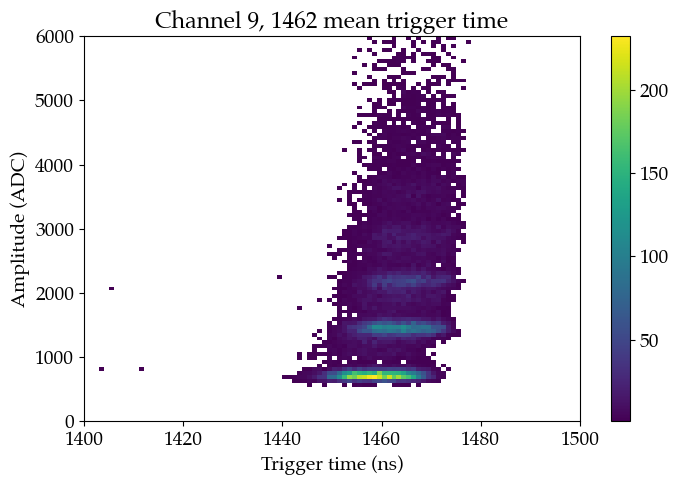

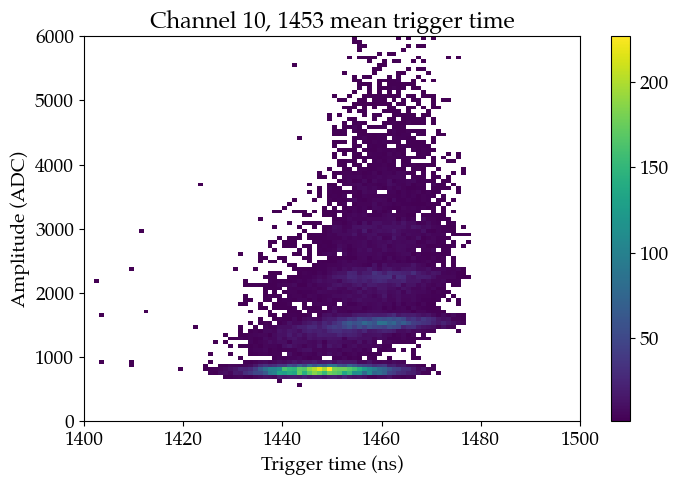

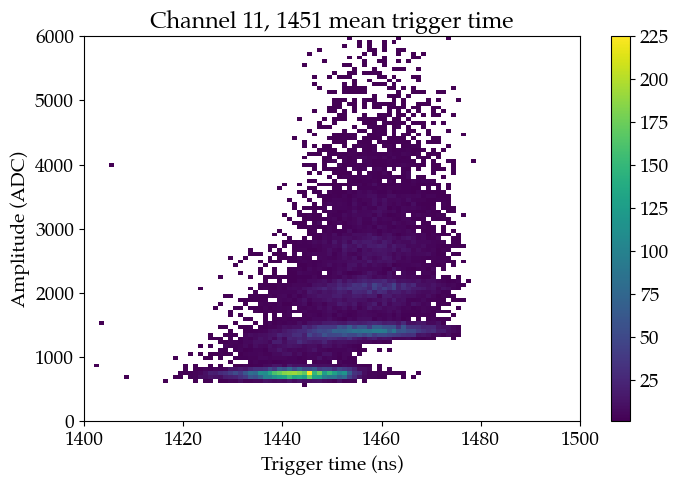

In [85]:
for ch in [9, 10, 11]:
    fig = plt.figure(figsize=(8, 5))
    plt.hist2d(trigg_t_chs[ch], max_trigg_chs[ch], bins=(100,100), range=((1400,1500), (0, 6000)), cmin=1)
    plt.title(f'Channel {ch}, {int(np.round(np.mean(trigg_t_chs[ch])))} mean trigger time')
    plt.xlabel('Trigger time (ns)')
    plt.ylabel('Amplitude (ADC)')
    plt.colorbar()
    plt.show()

In [89]:
filename   = '/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_pile_up_evts_thr80_mean_w30_dist50_run-11_25_2024-file_0.npz'
d          = np.load(filename, allow_pickle=True)
date, fnum = extract_date_and_number(filename)
filt_evts_test = d['filt_evts_dict'].item()[8]

filename2 = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-11_25_2024-file.root'
infile2   = uproot.open(filename2)
RawTree2  = infile2['RawTree']

trigger_chs = [9, 10, 11]
trigg_cwfs_dict = {ch: np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, max_smpl_bsl), std_lim=std_thr_dict[ch])
                                 for wf in pf.wfs_from_rawtree(RawTree2, ch)])
                   for ch in trigger_chs}

sg_filt_trigg_dict = {ch: savgol_filter(trigg_cwfs_dict[ch],
                                        window_length=sg_filter_window,
                                        polyorder=sg_filter_polyorder)
                      for ch in trigger_chs}

In [90]:
non_empty_idxs = [i for i,el in enumerate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[8]) if el.size > 0]
non_empty_evts = np.array(filt_evts_test[non_empty_idxs], dtype=int)

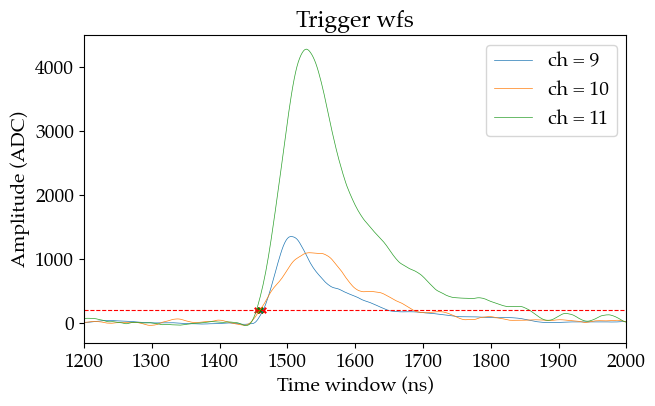

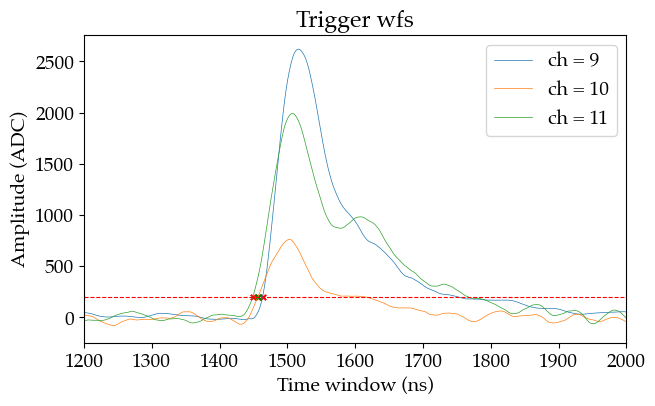

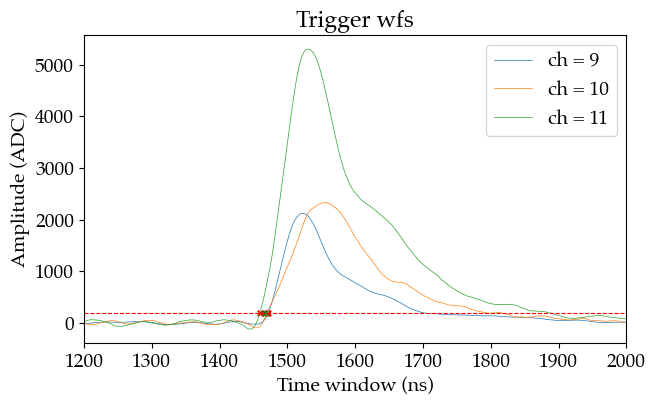

In [91]:
for evt in non_empty_evts[:3]:
    fig = plt.figure(figsize=(7, 4))
    trigg_ts = []
    for sel_ch in [9, 10, 11]:
        wf = sg_filt_trigg_dict[sel_ch][evt]
        
        swfs_rng_t   = (1400, 1500)
        wf_x         = 2*np.arange(len(wf))
        sel_swf_x_t  = wf_x[(wf_x > swfs_rng_t[0]) & (wf_x < swfs_rng_t[1])]
        sel_swf_y_t  = wf  [(wf_x > swfs_rng_t[0]) & (wf_x < swfs_rng_t[1])]
        crossing_200 = find_crossings(sel_swf_x_t, sel_swf_y_t, 200)
        trigg_ts.append(crossing_200[0])

        plt.plot(2*np.arange(len(wf)), wf, lw=0.5, label=f'ch = {sel_ch}')
        plt.scatter(crossing_200[0], 200, color='r', s=15, marker='x')
    
    plt.scatter(np.mean(trigg_ts), 200, color='g', s=15, marker='x')
    plt.axhline(200, color='r', ls='--', lw=0.8)
    plt.title(f'Trigger wfs')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.xlim(1200, 2000)
    plt.legend()
    plt.show()

## Analyze data using the trigger time:

In [92]:
filt_files5 = sorted(glob.glob(f'/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_pile_up_evts_thr{thr_ADC2}_mean_w{sg_filt_window}_dist{min_dist2}_run-11_25_2024-file*.npz'), key=extract_date_and_number)

filt_evts_sec3_chs  = {}
idx_peak_sec3_chs   = {}
h_peak_sec3_abs_chs = {}
h_peak_sec3_rel_chs = {}

trigger_samp_sec3     = {}
idx_peak_sec3_trigg   = {}
h_peak_sec3_abs_trigg = {}
h_peak_sec3_rel_trigg = {}

for filename in filt_files5:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_sec3_chs:
        
        for ch in trigger_chs:
            print(date)
            filt_evts_sec3_chs [date] = {ch: d['filt_evts_dict']                 .item()[ch] for ch in normal_chs}
            idx_peak_sec3_chs  [date] = {ch: d['idx_peaks_sg_deconv_sec_ch_dict'].item()[ch] for ch in normal_chs}
            h_peak_sec3_abs_chs[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch]) for ch in normal_chs}
            h_peak_sec3_rel_chs[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch]) for ch in normal_chs}
    
    else:
        for ch in normal_chs:
            try:
                filt_evts_sec3_chs [date][ch] = np.concatenate((filt_evts_sec3_chs [date][ch], adapt_evt_id(d['filt_evts_dict']    .item()[ch], fnum)))
                idx_peak_sec3_chs  [date][ch] = np.concatenate((idx_peak_sec3_chs  [date][ch], d['idx_peaks_sg_deconv_sec_ch_dict'].item()[ch]))
                h_peak_sec3_abs_chs[date][ch] = np.concatenate((h_peak_sec3_abs_chs[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_dict'].item()[ch])))
                h_peak_sec3_rel_chs[date][ch] = np.concatenate((h_peak_sec3_rel_chs[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
            
    if date not in trigger_samp_sec3:
        print(date)
        trigger_samp_sec3    [date] = {ch: d['trigger_samp_dict'].item()[ch] for ch in trigger_chs}
        idx_peak_sec3_trigg  [date] = {ch: d['idx_peaks_sg_deconv_sec_ch_trigg_dict'].item()[ch] for ch in trigger_chs}
        h_peak_sec3_abs_trigg[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        h_peak_sec3_rel_trigg[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        
    else:
        for ch in trigger_chs:
            try:
                trigger_samp_sec3    [date][ch] = np.concatenate((trigger_samp_sec3    [date][ch], d['trigger_samp_dict'].item()[ch]))
                idx_peak_sec3_trigg  [date][ch] = np.concatenate((idx_peak_sec3_trigg  [date][ch], d['idx_peaks_sg_deconv_sec_ch_trigg_dict']       .item()[ch]))
                h_peak_sec3_abs_trigg[date][ch] = np.concatenate((h_peak_sec3_abs_trigg[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_abs_ch_trigg_dict'].item()[ch])))
                h_peak_sec3_rel_trigg[date][ch] = np.concatenate((h_peak_sec3_rel_trigg[date][ch], np.concatenate(d['height_peaks_sg_deconv_sec_rel_ch_trigg_dict'].item()[ch])))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

11_25_2024
11_25_2024
11_25_2024
11_25_2024


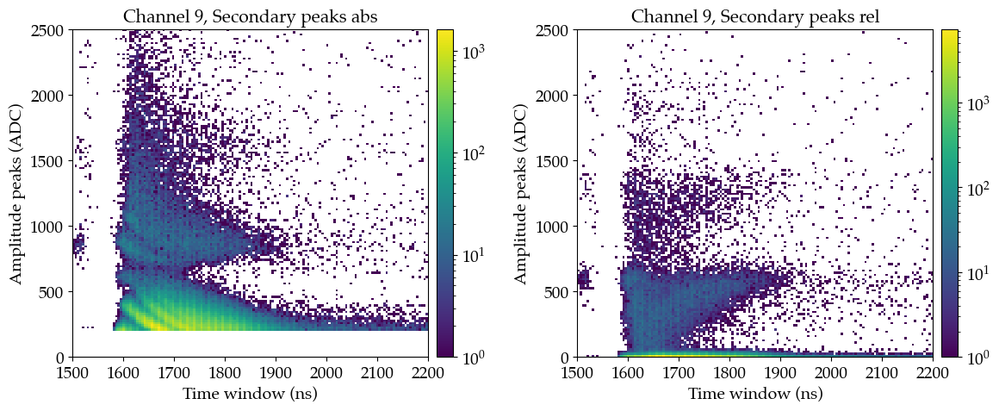

In [93]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec3_abs_trigg[date][ch], h_peak_sec3_rel_trigg[date][ch]]):
    fig0 = ax.hist2d(2*np.concatenate(idx_peak_sec3_trigg[date][ch]), hs, bins=(150, 150), range=((1500, 2200), (0, 2500)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

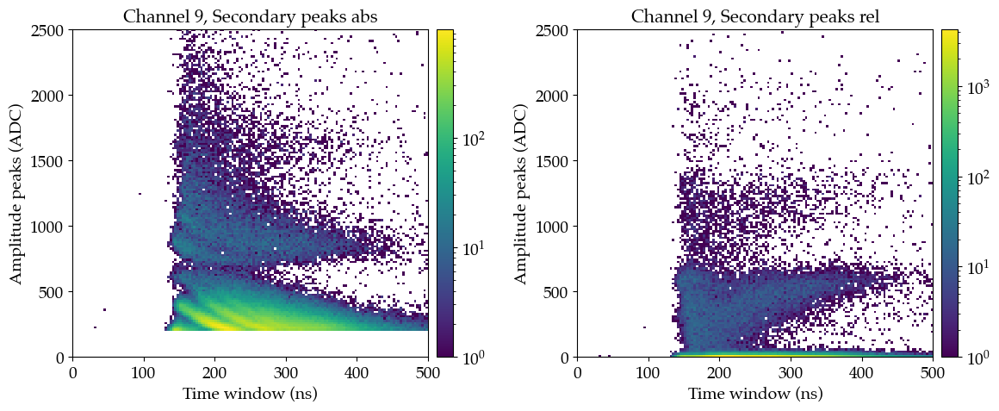

In [107]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec3_abs_trigg[date][ch], h_peak_sec3_rel_trigg[date][ch]]):
    means_trigg_sampl = np.mean(np.array([trigger_samp_sec3[date][ch] for ch in trigger_chs]), axis=0)
    norm_indxs        = 2*(idx_peak_sec3_trigg[date][ch]-means_trigg_sampl)
    fig0 = ax.hist2d(np.concatenate(norm_indxs), hs, bins=(150, 150), range=((0, 500), (0, 2500)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

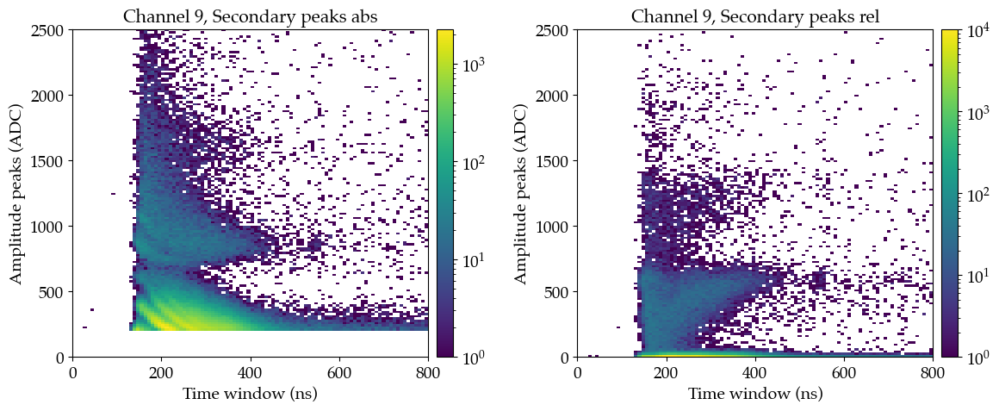

In [95]:
ch   = 9
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec3_abs_trigg[date][ch], h_peak_sec3_rel_trigg[date][ch]]):
    means_trigg_sampl = np.mean(np.array([trigger_samp_sec3[date][ch] for ch in trigger_chs]), axis=0)
    norm_indxs        = 2*(idx_peak_sec3_trigg[date][ch]-means_trigg_sampl)
    fig0 = ax.hist2d(np.concatenate(norm_indxs), hs, bins=(100, 150), range=((0, 800), (0, 2500)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

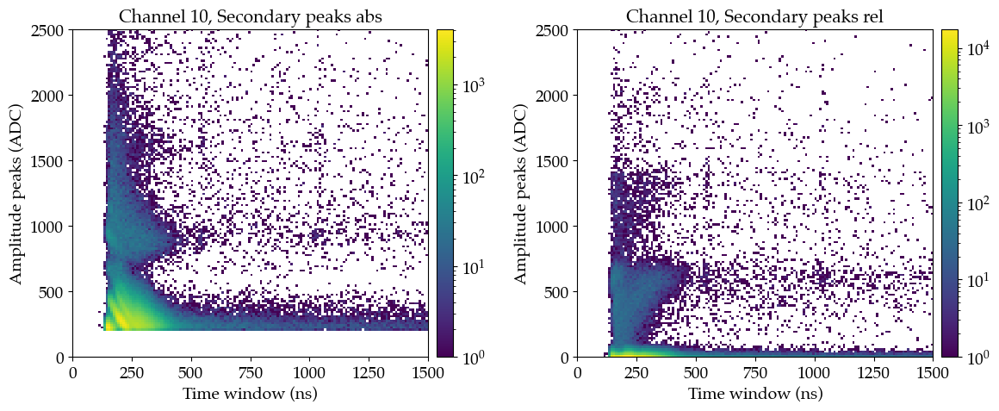

In [96]:
ch   = 10
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks abs', 'Secondary peaks rel'],
                                        [h_peak_sec3_abs_trigg[date][ch], h_peak_sec3_rel_trigg[date][ch]]):
    means_trigg_sampl = np.mean(np.array([trigger_samp_sec3[date][ch] for ch in trigger_chs]), axis=0)
    norm_indxs        = 2*(idx_peak_sec3_trigg[date][ch]-means_trigg_sampl)
    fig0 = ax.hist2d(np.concatenate(norm_indxs), hs, bins=(150, 150), range=((0, 1500), (0, 2500)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

In [101]:
idx_peak_sec3_trigg

{'11_25_2024': {9: array([array([], dtype=float64), array([], dtype=float64),
         array([], dtype=float64), ..., array([], dtype=float64),
         array([], dtype=float64), array([], dtype=float64)], dtype=object),
  10: array([array([], dtype=float64), array([], dtype=float64), array([868]),
         ..., array([], dtype=float64), array([833]), array([801])],
        dtype=object),
  11: array([array([], dtype=float64), array([806]), array([838]), ...,
         array([811]), array([], dtype=float64), array([], dtype=float64)],
        dtype=object)}}

NameError: name 'idx_test' is not defined

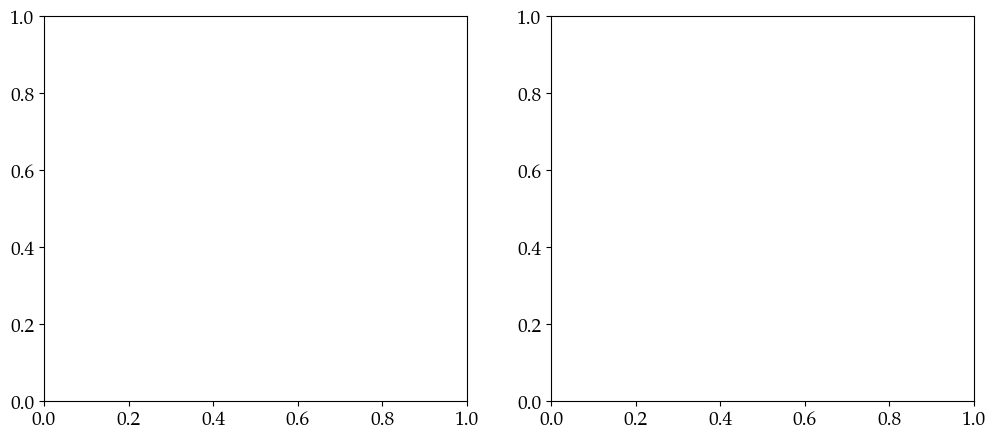

In [103]:
ch   = 8
date = '11_25_2024'

means_trigg_sampl = np.mean(np.array([trigger_samp_sec3[date][ch] for ch in trigger_chs]), axis=0)
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec3_abs_chs[date][ch], h_peak_sec3_rel_chs[date][ch]]):
    #norm_indxs        = 2*(idx_peak_sec3_chs[date][ch]-means_trigg_sampl)
    fig0 = ax.hist2d(np.concatenate((idx_test- trigg_t_test)), hs, bins=(500, 200), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()

In [104]:
trigger_times_all

{'11_25_2024': {9: array([727.62087132, 732.84767771, 734.65809103, ..., 731.16996906,
         728.89280988, 725.47578697])}}

KeyError: 10

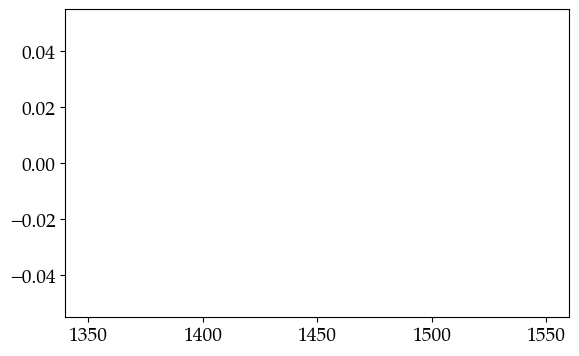

In [106]:
fig = plt.figure(figsize=(6.5, 4))
for ch in [9]:
    plt.hist(trigger_times_all[date][ch], bins=100, range=(1350, 1550), label=f'ch = {ch}', alpha=0.8)
plt.hist(np.mean([trigger_times_all[date][ch] for ch in [9, 10, 11]], axis=0), bins=100, range=(1350, 1550), label=f'mean', histtype='step', color='k')
plt.axvline(np.mean(np.mean([trigger_times_all[date][ch] for ch in [9, 10, 11]], axis=0)), )
plt.title('Trigger times')
plt.xlabel('Trigger time (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

NameError: name 'h_peak_sec2_abs_ch8' is not defined

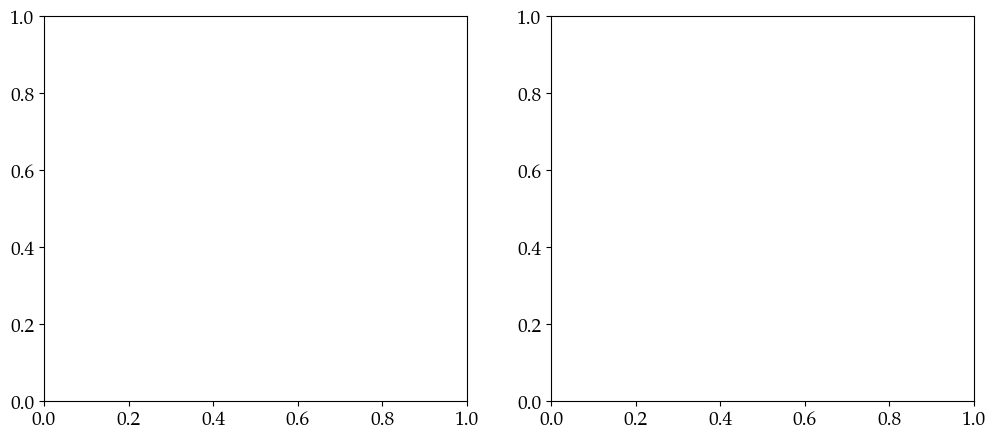

In [99]:
ch   = 8
date = '11_25_2024'

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
for ax, title, hs in zip(axs.flatten(), ['Secondary peaks absolute', 'Secondary peaks relative'],
                                        [h_peak_sec2_abs_ch8[date][ch], h_peak_sec2_rel_ch8[date][ch]]):
    fig0 = ax.hist2d(2*idx_peak_sec2_ch8[date][ch], hs, bins=(500, 200), range=((0, 15000), (0, 1200)), cmin=1, norm=LogNorm())
    ax.set_xlabel('Time window (ns)', fontsize=14)
    ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    ax.set_title(f"Channel {ch}, {title}", fontsize=15)
    fig.colorbar(fig0[3], ax=ax, pad=0.02)

plt.tight_layout()
plt.show()